In [ ]:
import os       # Used for interacting with the operating system, like listing directories and joining paths
import torch    # The main PyTorch library
import torch.nn as nn       # Contains modules for building neural networks (e.g., layers, activation functions)
from torch.utils.data import DataLoader, Dataset    # Utilities for handling datasets and loading data in batches
from efficientnet_pytorch import EfficientNet       # Library for pre-trained EfficientNet models
import albumentations as A       # Powerful image augmentation library
from albumentations.pytorch import ToTensorV2   # Specific transformation to convert image to PyTorch tensor
import cv2       # OpenCV library for image reading and processing
from tqdm import tqdm       # For displaying progress bars during loops (training/evaluation)

# CBAM(Convolutional Block Attention Module) Attention Module
class CBAM(nn.Module):
    def __init__(self, channels, reduction=16, kernel_size=7):
        super(CBAM, self).__init__()
        self.channel_attention = nn.Sequential(
            nn.AdaptiveAvgPool2d(1),
            nn.Conv2d(channels, channels // reduction, 1, bias=False),
            nn.ReLU(),
            nn.Conv2d(channels // reduction, channels, 1, bias=False),
            nn.Sigmoid()
        )
        self.spatial_attention = nn.Sequential(
            nn.Conv2d(2, 1, kernel_size, padding=kernel_size // 2, bias=False),
            nn.Sigmoid()
        )

    def forward(self, x):
        ca = self.channel_attention(x)
        x = x * ca
        max_out, _ = torch.max(x, dim=1, keepdim=True)
        mean_out = torch.mean(x, dim=1, keepdim=True)
        sa_input = torch.cat([max_out, mean_out], dim=1)
        sa = self.spatial_attention(sa_input)
        x = x * sa
        return x

# EfficientNet-B0 + CBAM model
class BreastNetPP(nn.Module):
    def __init__(self):
        super(BreastNetPP, self).__init__()
        self.backbone = EfficientNet.from_pretrained('efficientnet-b0')
        self.cbam = CBAM(1280)
        self.pool = nn.AdaptiveAvgPool2d(1)
        self.dropout1 = nn.Dropout(0.5)
        self.fc1 = nn.Linear(1280, 128)
        self.relu = nn.ReLU()
        self.dropout2 = nn.Dropout(0.3)
        self.fc2 = nn.Linear(128, 1)
        self.sigmoid = nn.Sigmoid()

    def forward(self, x):
        x = self.backbone.extract_features(x)
        x = self.cbam(x)
        x = self.pool(x)
        x = x.view(x.size(0), -1)
        x = self.dropout1(x)
        x = self.relu(self.fc1(x))
        x = self.dropout2(x)
        return self.sigmoid(self.fc2(x))


In [3]:
class CustomDataset(Dataset):
    def __init__(self, root_dir, transform=None):
        self.root_dir = root_dir
        self.transform = transform
        self.classes = ['benign', 'malignant']
        self.image_paths = []
        self.labels = []

        for label, cls in enumerate(self.classes):
            cls_path = os.path.join(root_dir, cls)
            for img_name in os.listdir(cls_path):
                self.image_paths.append(os.path.join(cls_path, img_name))
                self.labels.append(label)

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        image = cv2.imread(self.image_paths[idx])
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        label = self.labels[idx]

        if self.transform:
            image = self.transform(image=image)['image']

        return image, torch.tensor(label, dtype=torch.float32)


In [4]:
train_transform = A.Compose([
    A.Resize(160, 160),
    A.HorizontalFlip(p=0.5),
    A.RandomBrightnessContrast(p=0.2),
    A.Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225)),
    ToTensorV2()
])

val_transform = A.Compose([
    A.Resize(160, 160),
    A.Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225)),
    ToTensorV2()
])


In [5]:
train_dataset = CustomDataset("./Preprocessed/train", transform=train_transform)
val_dataset = CustomDataset("./Preprocessed/val", transform=val_transform)
test_dataset = CustomDataset("./Preprocessed/test", transform=val_transform)

train_loader = DataLoader(train_dataset, batch_size=8, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=8, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=8, shuffle=False)


In [6]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = BreastNetPP().to(device)
criterion = nn.BCELoss()
optimizer = torch.optim.Adam(model.parameters(), lr=1e-4)


Loaded pretrained weights for efficientnet-b0


In [18]:
import os
import torch
import torch.nn as nn
import numpy as np
from tqdm import tqdm
from sklearn.metrics import (
    accuracy_score, precision_score, recall_score,
    f1_score, confusion_matrix, classification_report
)

# Shared Results Dictionary
results = {}

# BreastNet++ Evaluation (uses sigmoid)
def test_breastnetpp(model, test_loader, checkpoint_path):
    print(f"[🔍 BRNet++] Loading model from: {checkpoint_path}")
    checkpoint = torch.load(checkpoint_path, map_location=device)
    model.load_state_dict(checkpoint['model_state_dict'])
    model.to(device)
    model.eval()

    all_preds, all_labels = [], []

    with torch.no_grad():
        for imgs, labels in tqdm(test_loader, desc="📦 Evaluating BRNet++"):
            imgs = imgs.to(device)
            labels = labels.to(device).unsqueeze(1)
            outputs = model(imgs)
            preds = (outputs > 0.5).float()

            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())

    y_pred = np.array(all_preds).flatten()
    y_true = np.array(all_labels).flatten()

    acc = accuracy_score(y_true, y_pred)
    prec = precision_score(y_true, y_pred, zero_division=0)
    rec = recall_score(y_true, y_pred, zero_division=0)
    f1 = f1_score(y_true, y_pred, zero_division=0)

    print("✅ Accuracy:", acc)
    print("✅ Precision:", prec)
    print("✅ Recall:", rec)
    print("✅ F1-Score:", f1)
    print("\nClassification Report:")
    print(classification_report(y_true, y_pred, target_names=["Benign", "Malignant"]))
    print("Confusion Matrix:")
    print(confusion_matrix(y_true, y_pred))

    results["BRNet++"] = {
        "labels": y_true,
        "preds": y_pred,
        "accuracy": acc,
        "precision": prec,
        "recall": rec,
        "f1": f1
    }

# ResNet18, VGG16, DenseNet Evaluation
def evaluate_model(model, model_path, model_name):
    print(f"[DEBUG] Loading model from: {model_path}")
    checkpoint = torch.load(model_path, map_location=device)
    if 'model_state_dict' in checkpoint:
        model.load_state_dict(checkpoint['model_state_dict'])
    else:
        model.load_state_dict(checkpoint)
    model.to(device)
    model.eval()

    all_preds, all_labels = [], []

    with torch.no_grad():
        for imgs, labels in tqdm(test_loader, desc=f"📦 Evaluating {model_name}"):
            imgs, labels = imgs.to(device), labels.to(device)
            outputs = model(imgs)
            probs = torch.softmax(outputs, dim=1)
            _, preds = torch.max(probs, 1)

            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())

    y_pred = np.array(all_preds)
    y_true = np.array(all_labels)

    acc = accuracy_score(y_true, y_pred)
    prec = precision_score(y_true, y_pred, zero_division=0)
    rec = recall_score(y_true, y_pred, zero_division=0)
    f1 = f1_score(y_true, y_pred, zero_division=0)

    results[model_name] = {
        "labels": y_true,
        "preds": y_pred,
        "accuracy": acc,
        "precision": prec,
        "recall": rec,
        "f1": f1
    }


In [19]:
import torchvision.models as models

# ✅ Model loaders
def get_resnet18():
    model = models.resnet18(weights=None)
    model.fc = nn.Linear(model.fc.in_features, 2)
    return model

def get_vgg16():
    model = models.vgg16(weights=None)
    model.classifier[6] = nn.Linear(model.classifier[6].in_features, 2)
    return model

def get_densenet():
    model = models.densenet121(weights=None)
    model.classifier = nn.Linear(model.classifier.in_features, 2)
    return model


In [20]:
# BRNet++
br_model = BreastNetPP()
test_breastnetpp(br_model, test_loader, "saved_models/breastnetpp_epoch_5.pth")




Loaded pretrained weights for efficientnet-b0
[🔍 BRNet++] Loading model from: saved_models/breastnetpp_epoch_5.pth


📦 Evaluating BRNet++: 100%|██████████| 6939/6939 [14:49<00:00,  7.80it/s]


✅ Accuracy: 0.907235253846431
✅ Precision: 0.8200687865805829
✅ Recall: 0.8624825485467699
✅ F1-Score: 0.8407410844081532

Classification Report:
              precision    recall  f1-score   support

      Benign       0.94      0.92      0.93     39748
   Malignant       0.82      0.86      0.84     15758

    accuracy                           0.91     55506
   macro avg       0.88      0.89      0.89     55506
weighted avg       0.91      0.91      0.91     55506

Confusion Matrix:
[[36766  2982]
 [ 2167 13591]]


In [26]:
# ResNet18
resnet_model = get_resnet18()
evaluate_model(resnet_model, "./resnet18 models/resnet18_epoch10.pth", "ResNet18")


[DEBUG] Loading model from: ./resnet18 models/resnet18_epoch10.pth


📦 Evaluating ResNet18: 100%|██████████| 6939/6939 [13:45<00:00,  8.41it/s]


In [21]:
# VGG16
vgg_model = get_vgg16()
evaluate_model(vgg_model, "./vgg16 models/vgg16_epoch_5.pth", "VGG16")

[DEBUG] Loading model from: ./vgg16 models/vgg16_epoch_5.pth


📦 Evaluating VGG16: 100%|██████████| 6939/6939 [16:44<00:00,  6.91it/s]


In [22]:
# DenseNet
dense_model = get_densenet()
evaluate_model(dense_model, "./Densenet model/densenet_epoch_5.pth", "DenseNet")

[DEBUG] Loading model from: ./Densenet model/densenet_epoch_5.pth


📦 Evaluating DenseNet: 100%|██████████| 6939/6939 [14:21<00:00,  8.06it/s]


In [23]:
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
from sklearn.metrics import confusion_matrix, roc_curve, auc, precision_recall_curve


def plot_all_metrics(results):
    model_names = list(results.keys())
    metrics = ['accuracy', 'precision', 'recall', 'f1']

    # Bar Charts for Accuracy, Precision, Recall, F1
    for metric in metrics:
        values = [results[model].get(metric, 0) for model in model_names]
        plt.figure(figsize=(10, 6))
        bars = plt.bar(model_names, values, color=sns.color_palette("Set2"))
        plt.title(f"{metric.capitalize()} Comparison")
        plt.ylabel(metric.capitalize())
        plt.ylim(0, 1)
        plt.grid(axis='y')
        for bar, val in zip(bars, values):
            plt.text(bar.get_x() + bar.get_width() / 2, bar.get_height() + 0.01, f"{val:.2f}", ha='center', va='bottom')
        plt.tight_layout()
        plt.show()

    # Confusion Matrices
    for model in model_names:
        y_true = results[model]['labels']
        y_pred = results[model]['preds']
        cm = confusion_matrix(y_true, y_pred)

        plt.figure(figsize=(6, 5))
        sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['Benign', 'Malignant'], yticklabels=['Benign', 'Malignant'])
        plt.title(f"Confusion Matrix - {model}")
        plt.xlabel("Predicted")
        plt.ylabel("Actual")
        plt.tight_layout()
        plt.show()

    # ROC Curves
    plt.figure(figsize=(10, 6))
    for model in model_names:
        if 'probs' in results[model]:
            fpr, tpr, _ = roc_curve(results[model]['labels'], results[model]['probs'])
            roc_auc = auc(fpr, tpr)
            plt.plot(fpr, tpr, label=f"{model} (AUC = {roc_auc:.2f})")
    plt.plot([0, 1], [0, 1], 'k--')
    plt.title("ROC Curve Comparison")
    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()

    # Precision-Recall Curves
    plt.figure(figsize=(10, 6))
    for model in model_names:
        if 'probs' in results[model]:
            precision, recall, _ = precision_recall_curve(results[model]['labels'], results[model]['probs'])
            plt.plot(recall, precision, label=f"{model}")
    plt.title("Precision-Recall Curve Comparison")
    plt.xlabel("Recall")
    plt.ylabel("Precision")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()



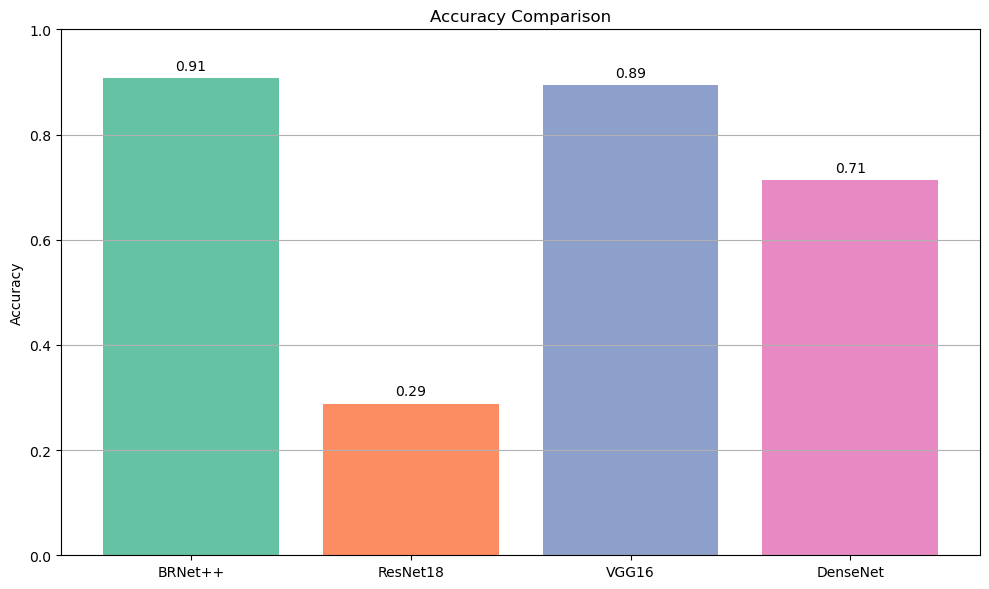

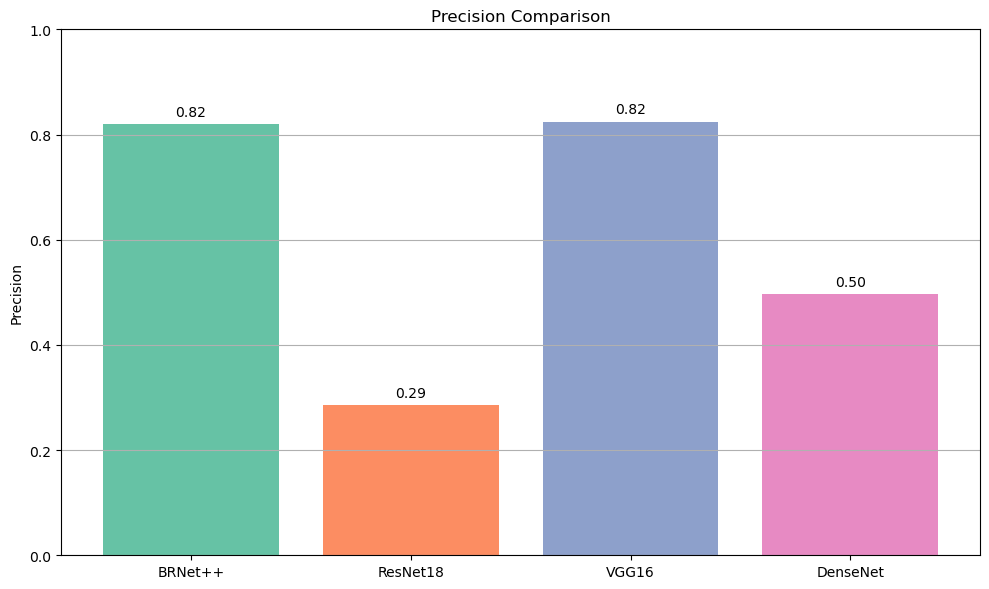

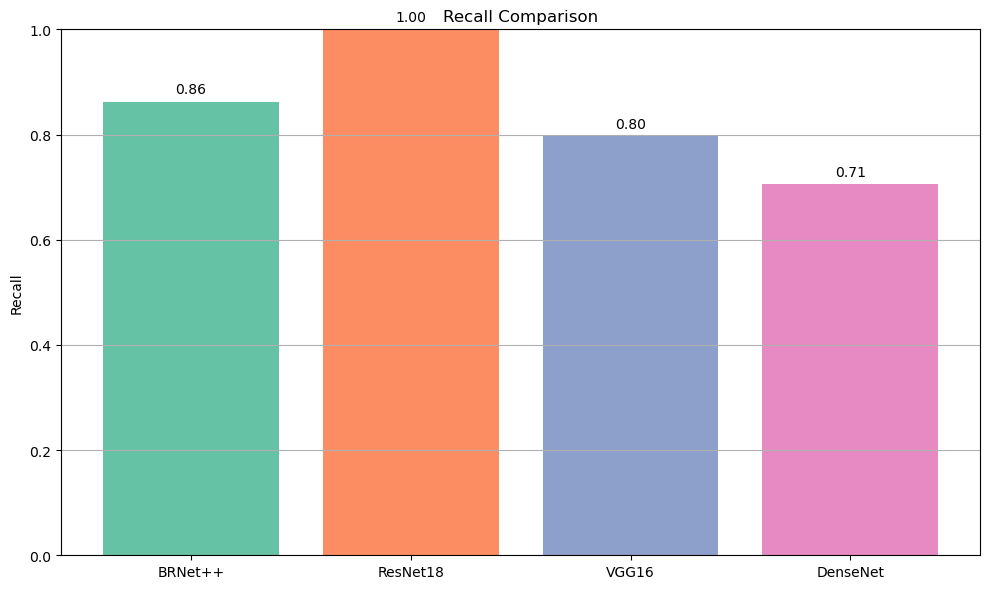

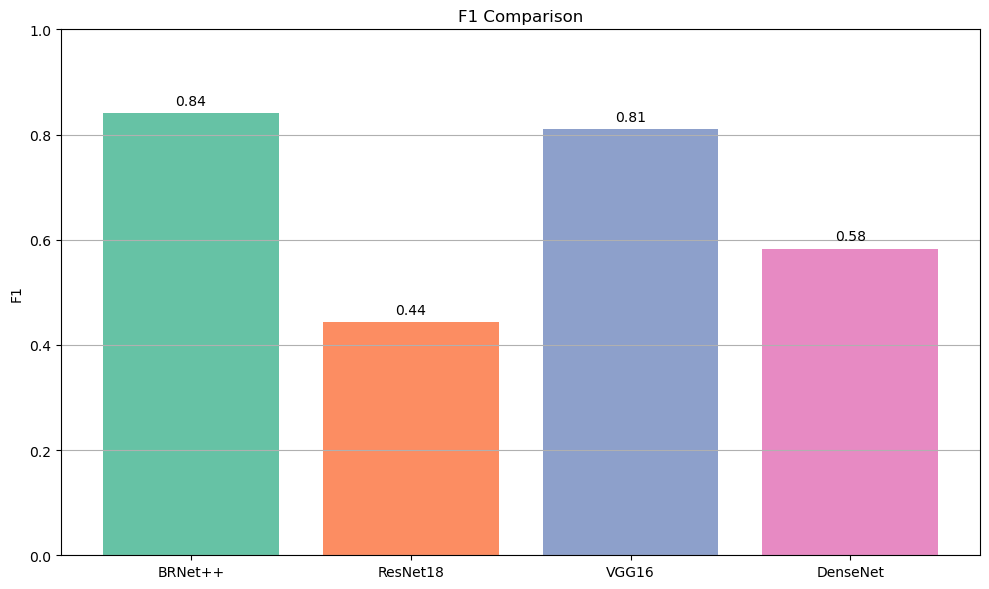

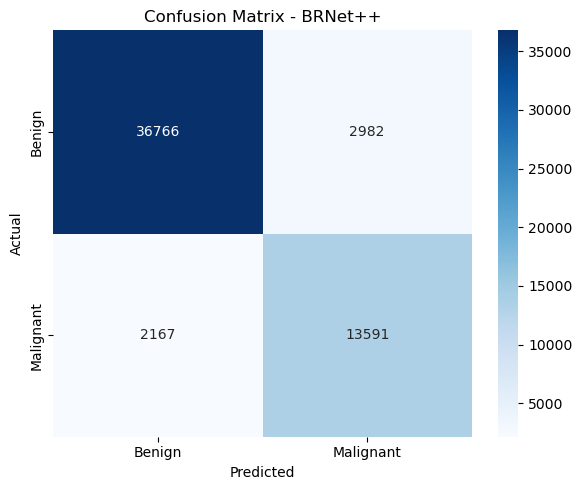

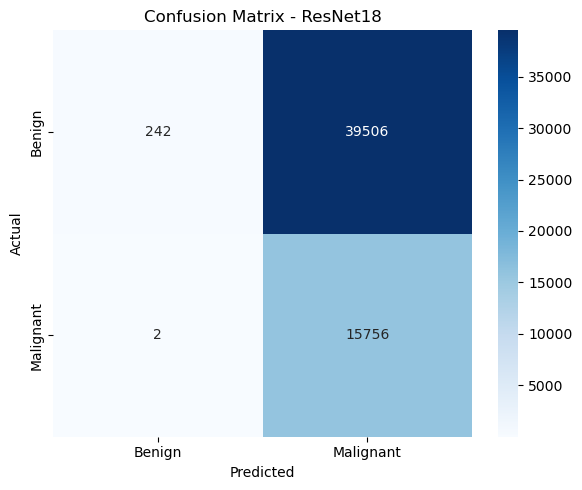

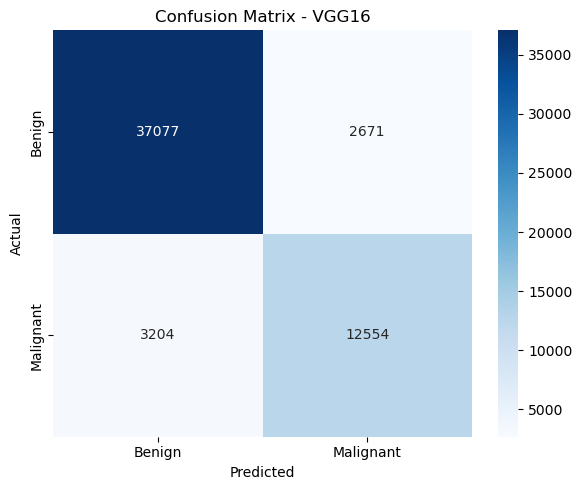

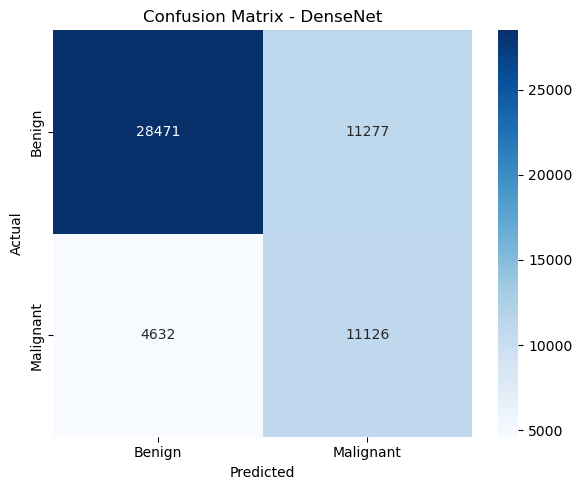

C:\Users\VICTUS\AppData\Local\Temp\ipykernel_2892\980733692.py:50: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


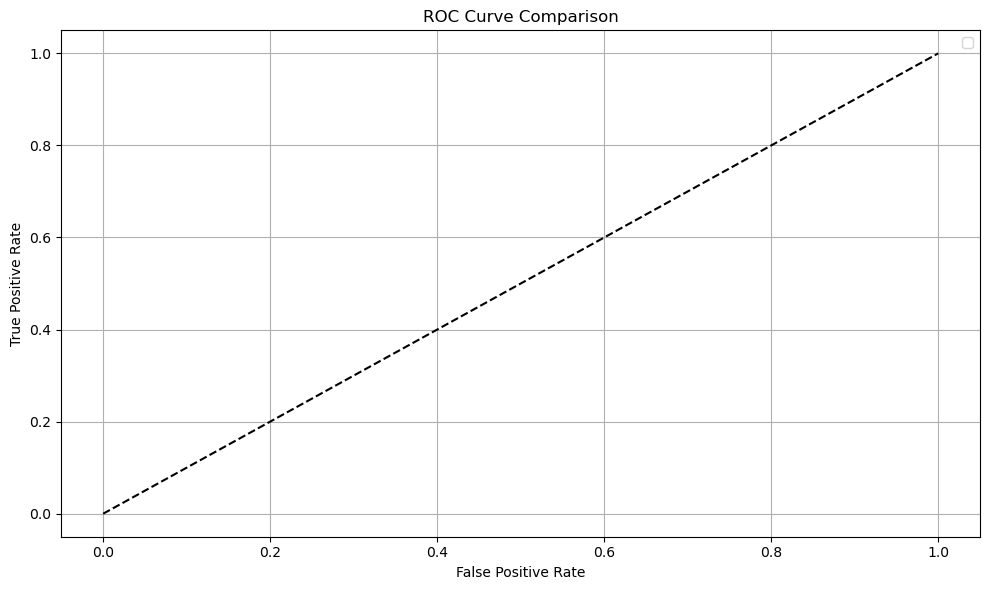

C:\Users\VICTUS\AppData\Local\Temp\ipykernel_2892\980733692.py:64: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


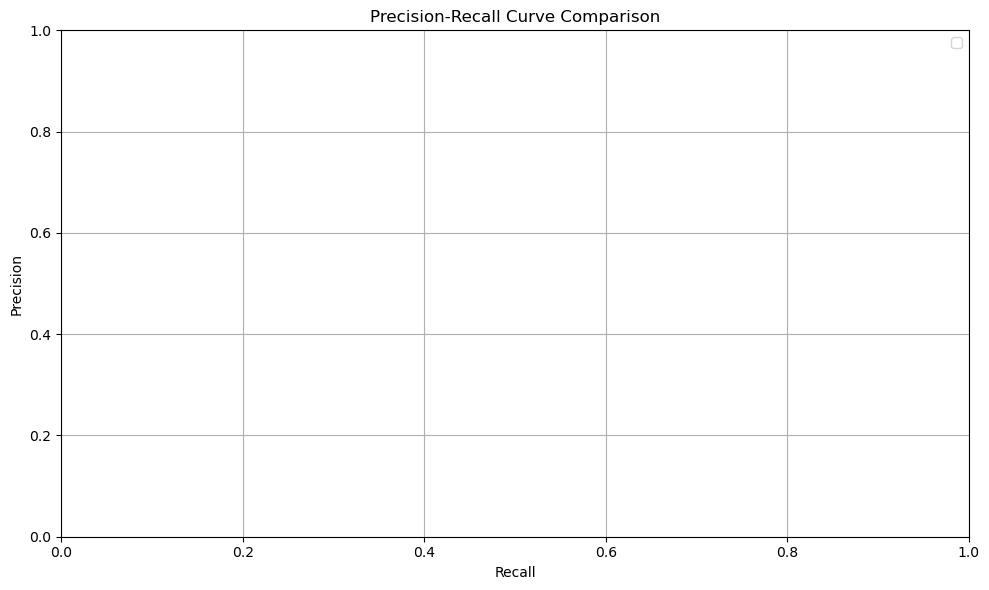

In [13]:

# Call this after populating your `results` dictionary:
plot_all_metrics(results)

In [15]:
results

{'ResNet18': {'labels': array([0., 0., 0., ..., 1., 1., 1.], dtype=float32),
  'preds': array([0, 0, 0, ..., 0, 0, 0], dtype=int64),
  'probs': array([2.1488912e-41, 6.4312824e-04, 8.3244935e-04, ..., 9.8016217e-02,
         6.4594522e-03, 4.3887351e-17], dtype=float32),
  'accuracy': 0.7009872806543437,
  'precision': 0.3270103092783505,
  'recall': 0.050323645132631045,
  'f1': 0.0872243304185228}}

In [24]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from sklearn.metrics import (
    accuracy_score, precision_score, recall_score, f1_score,
    confusion_matrix, classification_report
)

def plot_without_probs(results_dict, class_names=["Benign", "Malignant"]):
    metrics = {
        "Model": [],
        "Accuracy": [],
        "Precision": [],
        "Recall": [],
        "F1 Score": []
    }

    # 👉 Bar chart metrics collection
    for model_name, data in results_dict.items():
        y_true = data['labels']
        y_pred = data['preds']

        acc = accuracy_score(y_true, y_pred)
        prec = precision_score(y_true, y_pred, zero_division=0)
        rec = recall_score(y_true, y_pred, zero_division=0)
        f1 = f1_score(y_true, y_pred, zero_division=0)

        metrics["Model"].append(model_name)
        metrics["Accuracy"].append(acc)
        metrics["Precision"].append(prec)
        metrics["Recall"].append(rec)
        metrics["F1 Score"].append(f1)

        # 👉 Confusion matrix plot
        cm = confusion_matrix(y_true, y_pred)
        plt.figure(figsize=(4, 3))
        sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                    xticklabels=class_names, yticklabels=class_names)
        plt.title(f"{model_name} - Confusion Matrix")
        plt.xlabel("Predicted")
        plt.ylabel("True")
        plt.tight_layout()
        plt.show()

    # 👉 Bar plot for all metrics
    x = np.arange(len(metrics["Model"]))
    width = 0.2

    plt.figure(figsize=(10, 6))
    plt.bar(x - 1.5 * width, metrics["Accuracy"], width, label='Accuracy')
    plt.bar(x - 0.5 * width, metrics["Precision"], width, label='Precision')
    plt.bar(x + 0.5 * width, metrics["Recall"], width, label='Recall')
    plt.bar(x + 1.5 * width, metrics["F1 Score"], width, label='F1 Score')

    # 📌 Annotate each bar with value
    for i, metric in enumerate(["Accuracy", "Precision", "Recall", "F1 Score"]):
        for j, val in enumerate(metrics[metric]):
            plt.text(j + (i - 1.5) * width, val + 0.01, f"{val:.2f}", ha='center', fontsize=9)

    plt.xticks(x, metrics["Model"])
    plt.ylim(0, 1.1)
    plt.title("Model Comparison on Classification Metrics")
    plt.ylabel("Score")
    plt.legend()
    plt.grid(True, linestyle='--', alpha=0.5)
    plt.tight_layout()
    plt.show()


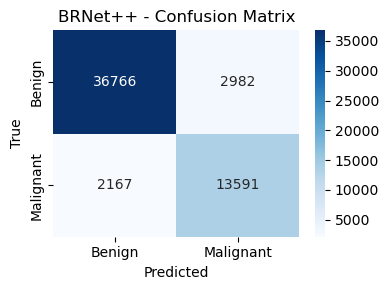

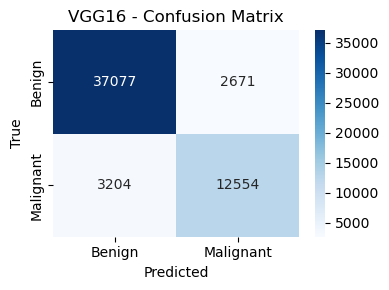

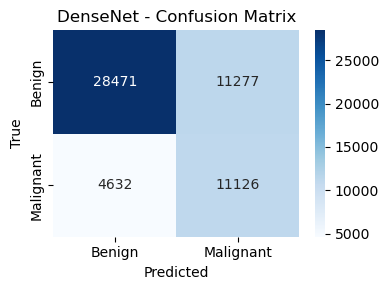

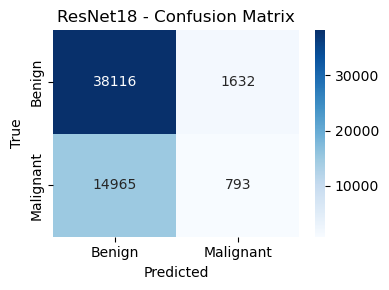

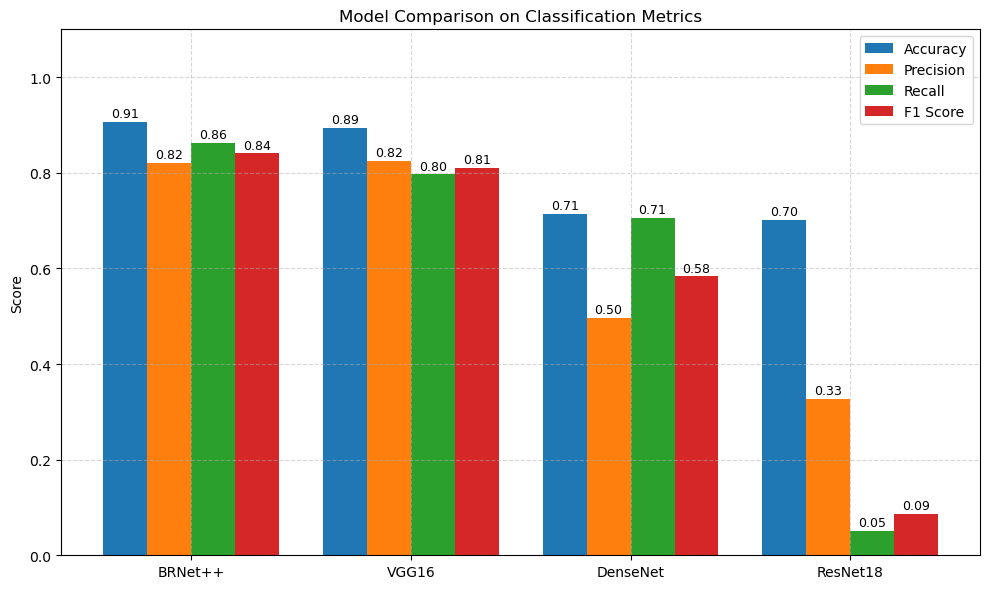

In [27]:
plot_without_probs(results)


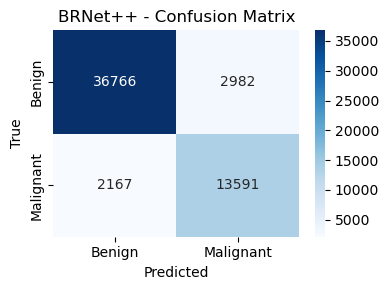

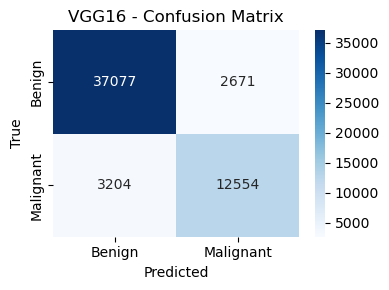

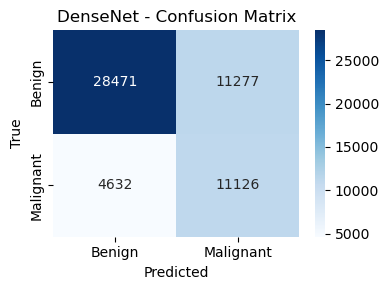

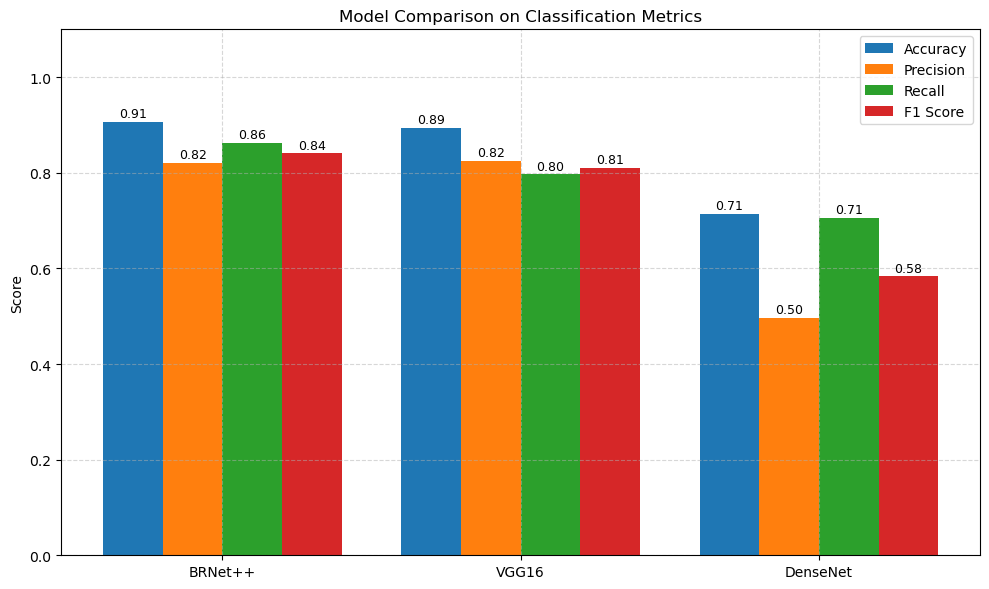

In [25]:
plot_without_probs(results)


## For curvese

In [1]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix, classification_report
import torch
import numpy as np
from tqdm import tqdm
import os

# 📦 Generic evaluation for multiclass outputs (ResNet, VGG, DenseNet)
def evaluate_multiclass_model(model_fn, model_path, test_loader):
    print(f"\n📦 Loading model from: {model_path}")
    model = model_fn()
    checkpoint = torch.load(model_path, map_location=device)
    if 'model_state_dict' in checkpoint:
        model.load_state_dict(checkpoint['model_state_dict'])
    else:
        model.load_state_dict(checkpoint)

    model.to(device)
    model.eval()

    all_preds = []
    all_labels = []
    all_probs = []

    with torch.no_grad():
        for imgs, labels in tqdm(test_loader, desc=f"🔍 Testing {os.path.basename(model_path)}"):
            imgs, labels = imgs.to(device), labels.to(device)
            outputs = model(imgs)
            probs = torch.softmax(outputs, dim=1)
            _, preds = torch.max(probs, 1)

            all_preds.extend(preds.cpu().numpy())
            all_probs.extend(probs[:, 1].cpu().numpy())  # Positive class
            all_labels.extend(labels.cpu().numpy())

    y_pred = np.array(all_preds)
    y_true = np.array(all_labels)
    y_prob = np.array(all_probs)

    # ✅ Evaluation Metrics
    acc = accuracy_score(y_true, y_pred)
    prec = precision_score(y_true, y_pred, zero_division=0)
    rec = recall_score(y_true, y_pred, zero_division=0)
    f1 = f1_score(y_true, y_pred, zero_division=0)

    print("\n📊 Evaluation Results:")
    print(f"✅ Accuracy  : {acc:.4f}")
    print(f"✅ Precision : {prec:.4f}")
    print(f"✅ Recall    : {rec:.4f}")
    print(f"✅ F1-Score  : {f1:.4f}")
    print("\n📄 Classification Report:")
    print(classification_report(y_true, y_pred, target_names=["Benign", "Malignant"]))
    print("\n🧩 Confusion Matrix:")
    print(confusion_matrix(y_true, y_pred))

    return {
        'labels': y_true,
        'preds': y_pred,
        'probs': y_prob,
        'accuracy': acc,
        'precision': prec,
        'recall': rec,
        'f1': f1
    }

# ✅ Example model loader functions
def get_resnet18():
    from torchvision import models
    import torch.nn as nn
    model = models.resnet18(weights=None)
    model.fc = nn.Linear(model.fc.in_features, 2)
    return model

def get_vgg16():
    from torchvision import models
    import torch.nn as nn
    model = models.vgg16(weights=None)
    model.classifier[6] = nn.Linear(model.classifier[6].in_features, 2)
    return model

def get_densenet():
    from torchvision import models
    import torch.nn as nn
    model = models.densenet121(weights=None)
    model.classifier = nn.Linear(model.classifier.in_features, 2)
    return model


In [11]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix, classification_report
import torch
import numpy as np
from tqdm import tqdm

# ✅ Modified Evaluation Function with Probabilities for Curve Plotting for BRNet++
def test_brnetpp_model(model, checkpoint_path, test_loader):
    print(f"\n📦 Loading BRNet++ model from {checkpoint_path}")
    checkpoint = torch.load(checkpoint_path, map_location=device)
    model.load_state_dict(checkpoint['model_state_dict'])
    model.to(device)
    model.eval()

    all_preds = []
    all_labels = []
    all_probs = []

    with torch.no_grad():
        for imgs, labels in tqdm(test_loader, desc="🔍 Testing BRNet++"):
            imgs = imgs.to(device)
            labels = labels.to(device).unsqueeze(1)
            outputs = model(imgs)
            probs = torch.sigmoid(outputs)  # Probability of positive class
            preds = (probs > 0.5).float()   # Binary prediction from sigmoid

            all_preds.extend(preds.cpu().numpy())
            all_probs.extend(probs.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())

    y_pred = np.array(all_preds).flatten()
    y_true = np.array(all_labels).flatten()
    y_prob = np.array(all_probs).flatten()

    # ✅ Evaluation Metrics
    acc = accuracy_score(y_true, y_pred)
    prec = precision_score(y_true, y_pred, zero_division=0)
    rec = recall_score(y_true, y_pred, zero_division=0)
    f1 = f1_score(y_true, y_pred, zero_division=0)

    print("\n📊 Evaluation Results:")
    print(f"✅ Accuracy  : {acc:.4f}")
    print(f"✅ Precision : {prec:.4f}")
    print(f"✅ Recall    : {rec:.4f}")
    print(f"✅ F1-Score  : {f1:.4f}")
    print("\n📄 Classification Report:")
    print(classification_report(y_true, y_pred, target_names=["Benign", "Malignant"]))
    print("\n🧩 Confusion Matrix:")
    print(confusion_matrix(y_true, y_pred))

    return {
        'labels': y_true,
        'preds': y_pred,
        'probs': y_prob,
        'accuracy': acc,
        'precision': prec,
        'recall': rec,
        'f1': f1
    }


In [12]:
results = {}

In [13]:
results["ResNet18"] = evaluate_multiclass_model(get_resnet18, "./resnet18 models/resnet18_epoch10.pth", test_loader)


📦 Loading model from: ./resnet18 models/resnet18_epoch10.pth


🔍 Testing resnet18_epoch10.pth: 100%|██████████| 6939/6939 [15:24<00:00,  7.51it/s]



📊 Evaluation Results:
✅ Accuracy  : 0.7010
✅ Precision : 0.3270
✅ Recall    : 0.0503
✅ F1-Score  : 0.0872

📄 Classification Report:
              precision    recall  f1-score   support

      Benign       0.72      0.96      0.82     39748
   Malignant       0.33      0.05      0.09     15758

    accuracy                           0.70     55506
   macro avg       0.52      0.50      0.45     55506
weighted avg       0.61      0.70      0.61     55506


🧩 Confusion Matrix:
[[38116  1632]
 [14965   793]]


In [16]:
results["ResNet18"] = evaluate_multiclass_model(get_resnet18, "./resnet18 models/resnet18_epoch5.pth", test_loader)


📦 Loading model from: ./resnet18 models/resnet18_epoch5.pth


🔍 Testing resnet18_epoch5.pth: 100%|██████████| 6939/6939 [11:21<00:00, 10.19it/s]



📊 Evaluation Results:
✅ Accuracy  : 0.2882
✅ Precision : 0.2851
✅ Recall    : 0.9999
✅ F1-Score  : 0.4437

📄 Classification Report:
              precision    recall  f1-score   support

      Benign       0.99      0.01      0.01     39748
   Malignant       0.29      1.00      0.44     15758

    accuracy                           0.29     55506
   macro avg       0.64      0.50      0.23     55506
weighted avg       0.79      0.29      0.13     55506


🧩 Confusion Matrix:
[[  242 39506]
 [    2 15756]]


In [14]:
results["DenseNet"] = evaluate_multiclass_model(get_densenet, "./Densenet model/densenet_epoch_5.pth", test_loader)


📦 Loading model from: ./Densenet model/densenet_epoch_5.pth


🔍 Testing densenet_epoch_5.pth:  35%|███▍      | 2416/6939 [05:28<10:15,  7.35it/s]


KeyboardInterrupt: 

In [ ]:
results["VGG16"] = evaluate_multiclass_model(get_vgg16, "./vgg16 models/vgg16_epoch_5.pth", test_loader)


📦 Loading model from: ./vgg16 models/vgg16_epoch_5.pth


🔍 Testing vgg16_epoch_5.pth: 100%|██████████| 6939/6939 [14:22<00:00,  8.04it/s]



📊 Evaluation Results:
✅ Accuracy  : 0.8942
✅ Precision : 0.8246
✅ Recall    : 0.7967
✅ F1-Score  : 0.8104

📄 Classification Report:
              precision    recall  f1-score   support

      Benign       0.92      0.93      0.93     39748
   Malignant       0.82      0.80      0.81     15758

    accuracy                           0.89     55506
   macro avg       0.87      0.86      0.87     55506
weighted avg       0.89      0.89      0.89     55506


🧩 Confusion Matrix:
[[37077  2671]
 [ 3204 12554]]


In [ ]:
# BRNet++
br_model = BreastNetPP()
# CORRECT CALLING ORDER: model, checkpoint_path, test_loader
results["BreastNet++"] = test_brnetpp_model(br_model, "saved_models/breastnetpp_epoch_5.pth", test_loader)


Loaded pretrained weights for efficientnet-b0

📦 Loading BRNet++ model from saved_models/breastnetpp_epoch_5.pth


🔍 Testing BRNet++: 100%|██████████| 6939/6939 [12:38<00:00,  9.14it/s]



📊 Evaluation Results:
✅ Accuracy  : 0.2839
✅ Precision : 0.2839
✅ Recall    : 1.0000
✅ F1-Score  : 0.4423

📄 Classification Report:
              precision    recall  f1-score   support

      Benign       1.00      0.00      0.00     39748
   Malignant       0.28      1.00      0.44     15758

    accuracy                           0.28     55506
   macro avg       0.64      0.50      0.22     55506
weighted avg       0.80      0.28      0.13     55506


🧩 Confusion Matrix:
[[    2 39746]
 [    0 15758]]


In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import roc_curve, auc, precision_recall_curve, confusion_matrix

# ✅ Plot Bar Chart for Metrics
def plot_metrics_bar(results):
    metrics = ['accuracy', 'precision', 'recall', 'f1']
    model_names = list(results.keys())
    
    values = {m: [results[model][m] for model in model_names] for m in metrics}

    plt.figure(figsize=(12, 6))
    for idx, metric in enumerate(metrics):
        plt.subplot(1, 4, idx+1)
        bars = plt.bar(model_names, values[metric], color='skyblue')
        plt.ylim(0, 1)
        plt.title(metric.upper())
        for bar in bars:
            yval = bar.get_height()
            plt.text(bar.get_x() + bar.get_width()/2.0, yval + 0.02, f"{yval:.2f}", ha='center', va='bottom')
        plt.xticks(rotation=45)
    plt.tight_layout()
    plt.suptitle("Model Performance Metrics", y=1.05)
    plt.show()

# ✅ ROC Curves
def plot_roc_curves(results):
    plt.figure(figsize=(8, 6))
    for model_name, data in results.items():
        if 'probs' in data:
            fpr, tpr, _ = roc_curve(data['labels'], data['probs'])
            roc_auc = auc(fpr, tpr)
            plt.plot(fpr, tpr, label=f"{model_name} (AUC = {roc_auc:.2f})")

    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.title("ROC Curve Comparison")
    plt.legend()
    plt.grid(True)
    plt.show()

# ✅ Precision-Recall Curve
def plot_pr_curves(results):
    plt.figure(figsize=(8, 6))
    for model_name, data in results.items():
        if 'probs' in data:
            precision, recall, _ = precision_recall_curve(data['labels'], data['probs'])
            plt.plot(recall, precision, label=model_name)

    plt.xlabel("Recall")
    plt.ylabel("Precision")
    plt.title("Precision-Recall Curve Comparison")
    plt.legend()
    plt.grid(True)
    plt.show()

# ✅ Confusion Matrices
def plot_confusion_matrices(results):
    fig, axes = plt.subplots(1, len(results), figsize=(5 * len(results), 4))
    if len(results) == 1:
        axes = [axes]

    for ax, (model_name, data) in zip(axes, results.items()):
        cm = confusion_matrix(data['labels'], data['preds'])
        sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', ax=ax, cbar=False)
        ax.set_title(model_name)
        ax.set_xlabel("Predicted")
        ax.set_ylabel("Actual")
        ax.set_xticklabels(["Benign", "Malignant"])
        ax.set_yticklabels(["Benign", "Malignant"])

    plt.tight_layout()
    plt.suptitle("Confusion Matrices", y=1.05)
    plt.show()

# ✅ Call all plots
def plot_all_comparisons(results):
    plot_metrics_bar(results)
    plot_roc_curves(results)
    plot_pr_curves(results)
    plot_confusion_matrices(results)


In [ ]:
plot_all_comparisons(results)

In [9]:
import torch
import numpy as np
import matplotlib.pyplot as plt
from torchvision.transforms.functional import to_pil_image
from PIL import Image
from torchcam.methods import SmoothGradCAMpp
import os


def generate_gradcam_overlay(
    model, 
    image_tensor, 
    class_idx, 
    target_layer, 
    output_path="gradcam_result.png", 
    device="cuda"
):
    """
    Generate and save a Grad-CAM overlay for a single image.

    Parameters:
    - model: PyTorch model
    - image_tensor: input image tensor (C, H, W)
    - class_idx: index of the class to visualize (0 or 1)
    - target_layer: model layer to target with Grad-CAM
    - output_path: where to save the final overlay image
    - device: 'cuda' or 'cpu'
    """

    model.to(device).eval()
    cam_extractor = SmoothGradCAMpp(model, target_layer=target_layer)

    # Forward pass
    input_tensor = image_tensor.unsqueeze(0).to(device)
    output = model(input_tensor)

    # Backward on the class score
    class_score = output[:, class_idx].sum()
    model.zero_grad()
    class_score.backward()

    # Generate CAM
    cam = cam_extractor(class_idx, output)[0].cpu().squeeze().numpy()
    cam = np.maximum(cam, 0)
    cam = (cam - cam.min()) / (cam.max() + 1e-8)  # Normalize
    cam = np.uint8(255 * cam)
    cam = Image.fromarray(cam).resize((224, 224), resample=Image.BILINEAR)

    # Base image
    base_img = to_pil_image(image_tensor.cpu())
    base_np = np.array(base_img)
    cam_np = np.array(cam)

    # Create overlay
    heatmap = plt.cm.jet(cam_np / 255.0)[:, :, :3]
    heatmap = np.uint8(255 * heatmap)
    overlay = np.uint8(0.5 * base_np + 0.5 * heatmap)

    # Save and show
    Image.fromarray(overlay).save(output_path)
    print(f"[✅] Grad-CAM saved to: {output_path}")

    # Optional visualization
    plt.figure(figsize=(10, 4))
    plt.subplot(1, 2, 1)
    plt.imshow(base_np)
    plt.title("Original")
    plt.axis("off")
    plt.subplot(1, 2, 2)
    plt.imshow(overlay)
    plt.title("Grad-CAM Overlay")
    plt.axis("off")
    plt.tight_layout()
    plt.show()


In [8]:
!pip install torchcam

In [30]:
import torch
import torch.nn as nn
from efficientnet_pytorch import EfficientNet

# ✅ CBAM Module
class CBAM(nn.Module):
    def __init__(self, channels, reduction=16, kernel_size=7):
        super(CBAM, self).__init__()
        self.channel_attention = nn.Sequential(
            nn.AdaptiveAvgPool2d(1),
            nn.Conv2d(channels, channels // reduction, 1, bias=False),
            nn.ReLU(),
            nn.Conv2d(channels // reduction, channels, 1, bias=False),
            nn.Sigmoid()
        )
        self.spatial_attention = nn.Sequential(
            nn.Conv2d(2, 1, kernel_size, padding=kernel_size // 2, bias=False),
            nn.Sigmoid()
        )

    def forward(self, x):
        ca = self.channel_attention(x)
        x = x * ca
        max_out, _ = torch.max(x, dim=1, keepdim=True)
        mean_out = torch.mean(x, dim=1, keepdim=True)
        sa_input = torch.cat([max_out, mean_out], dim=1)
        sa = self.spatial_attention(sa_input)
        x = x * sa
        return x

# ✅ BreastNet++ model (matches your saved model)
class BreastNetPP(nn.Module):
    def __init__(self):
        super(BreastNetPP, self).__init__()
        self.backbone = EfficientNet.from_pretrained('efficientnet-b0')
        self.cbam = CBAM(1280)  # match the old saved checkpoint
        self.pool = nn.AdaptiveAvgPool2d(1)
        self.dropout1 = nn.Dropout(0.5)
        self.fc1 = nn.Linear(1280, 128)
        self.relu = nn.ReLU()
        self.dropout2 = nn.Dropout(0.3)
        self.fc2 = nn.Linear(128, 1)  # ✅ matches checkpoint output shape

    def forward(self, x):
        x = self.backbone.extract_features(x)
        x = self.cbam(x)  # match old checkpoint name
        x = self.pool(x).view(x.size(0), -1)
        x = self.dropout1(x)
        x = self.relu(self.fc1(x))
        x = self.dropout2(x)
        return self.fc2(x)  # raw logits; apply sigmoid externally if needed


In [26]:
from torchcam.methods import SmoothGradCAMpp
import matplotlib.pyplot as plt
import numpy as np
from PIL import Image
from torchvision.transforms.functional import to_pil_image
import torch

def generate_gradcam_for_classification(
    model, image_tensor, class_idx, target_layer, output_path="gradcam_output.png", device="cuda"
):
    model.to(device).eval()
    cam_extractor = SmoothGradCAMpp(model, target_layer=target_layer)

    # Forward and backward
    input_tensor = image_tensor.unsqueeze(0).to(device)
    output = model(input_tensor)
    class_score = output[:, class_idx].sum()
    model.zero_grad()
    class_score.backward()

    # Get CAM and normalize
    cam = cam_extractor(class_idx, output)[0].cpu().squeeze().numpy()
    cam = np.maximum(cam, 0)
    cam = (cam - cam.min()) / (cam.max() + 1e-8)
    cam = np.uint8(255 * cam)
    cam_img = Image.fromarray(cam).resize((224, 224), resample=Image.BILINEAR)
    cam_np = np.array(cam_img)

    base_np = np.array(to_pil_image(image_tensor.cpu()))
    heatmap = np.uint8(255 * plt.cm.jet(cam_np / 255.0)[:, :, :3])
    overlay = np.uint8(0.5 * base_np + 0.5 * heatmap)

    # Save and display
    Image.fromarray(overlay).save(output_path)
    print(f"[✅] Saved Grad-CAM to {output_path}")

    plt.figure(figsize=(10, 4))
    plt.subplot(1, 2, 1)
    plt.imshow(base_np)
    plt.title("Original")
    plt.axis("off")
    plt.subplot(1, 2, 2)
    plt.imshow(overlay)
    plt.title("Grad-CAM Overlay")
    plt.axis("off")
    plt.tight_layout()
    plt.show()


In [31]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = BreastNetPP()

checkpoint = torch.load("saved_models/breastnetpp_epoch_5.pth", map_location=device)
state_dict = checkpoint['model_state_dict'] if isinstance(checkpoint, dict) and 'model_state_dict' in checkpoint else checkpoint

model.load_state_dict(state_dict)
model.to(device)
model.eval()


Loaded pretrained weights for efficientnet-b0


BreastNetPP(
  (backbone): EfficientNet(
    (_conv_stem): Conv2dStaticSamePadding(
      3, 32, kernel_size=(3, 3), stride=(2, 2), bias=False
      (static_padding): ZeroPad2d((0, 1, 0, 1))
    )
    (_bn0): BatchNorm2d(32, eps=0.001, momentum=0.010000000000000009, affine=True, track_running_stats=True)
    (_blocks): ModuleList(
      (0): MBConvBlock(
        (_depthwise_conv): Conv2dStaticSamePadding(
          32, 32, kernel_size=(3, 3), stride=[1, 1], groups=32, bias=False
          (static_padding): ZeroPad2d((1, 1, 1, 1))
        )
        (_bn1): BatchNorm2d(32, eps=0.001, momentum=0.010000000000000009, affine=True, track_running_stats=True)
        (_se_reduce): Conv2dStaticSamePadding(
          32, 8, kernel_size=(1, 1), stride=(1, 1)
          (static_padding): Identity()
        )
        (_se_expand): Conv2dStaticSamePadding(
          8, 32, kernel_size=(1, 1), stride=(1, 1)
          (static_padding): Identity()
        )
        (_project_conv): Conv2dStaticSamePaddin

In [27]:
from torchvision.models import resnet18, vgg16, densenet121
import torch.nn as nn

# def get_resnet18():
#     model = resnet18(pretrained=True)
#     model.fc = nn.Linear(model.fc.in_features, 2)
#     return model, 'layer4'  # Last convolution block

def get_vgg16():
    model = vgg16(pretrained=True)
    model.classifier[6] = nn.Linear(4096, 2)
    return model, 'features.29'  # Last conv layer in VGG

def get_densenet121():
    model = densenet121(pretrained=True)
    model.classifier = nn.Linear(1024, 2)
    return model, 'features.denseblock4'  # Last dense block


d:\Anaconda\envs\xai-trainer\Lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
d:\Anaconda\envs\xai-trainer\Lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/vgg16-397923af.pth" to C:\Users\VICTUS/.cache\torch\hub\checkpoints\vgg16-397923af.pth
100%|██████████| 528M/528M [00:27<00:00, 19.8MB/s] 
d:\Anaconda\envs\xai-trainer\Lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 a


🚀 Generating Grad-CAM for VGG16
[✅] Saved Grad-CAM to gradcam_VGG16.png


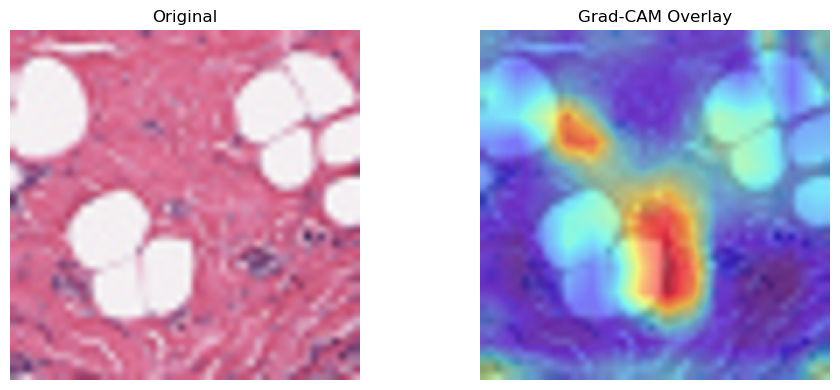


🚀 Generating Grad-CAM for DenseNet
[✅] Saved Grad-CAM to gradcam_DenseNet.png


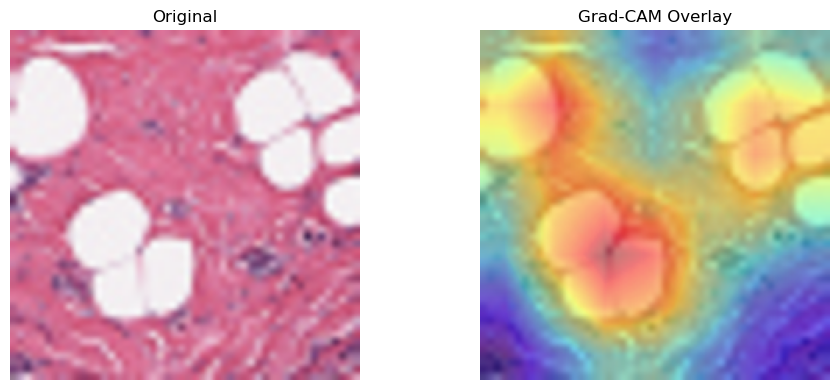

In [ ]:
import torchvision.transforms as transforms
from PIL import Image

# Transform and image
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
])

image = Image.open(r"./Preprocessed/test/malignant/IDC_1_8863_idx5_x1001_y801_class1.png").convert("RGB")
image_tensor = transform(image)

# Device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Load models one-by-one
model_infos = {
    # "ResNet18": get_resnet18(),
    "VGG16": get_vgg16(),
    "DenseNet": get_densenet121()
}

for name, (model, target_layer_name) in model_infos.items():
    print(f"\n🚀 Generating Grad-CAM for {name}")
    
    # Load checkpoint if you have one
    checkpoint_path = f"./{name.lower()}_model.pth"
    if os.path.exists(checkpoint_path):
        checkpoint = torch.load(checkpoint_path, map_location=device)
        if isinstance(checkpoint, dict) and 'model_state_dict' in checkpoint:
            model.load_state_dict(checkpoint['model_state_dict'])
        else:
            model.load_state_dict(checkpoint)
    
    # Extract the actual target layer
    target_layer = dict([*model.named_modules()])[target_layer_name]
    
    # Run Grad-CAM
    generate_gradcam_for_classification(
        model=model,
        image_tensor=image_tensor,
        class_idx=1,
        target_layer=target_layer,
        output_path=f"gradcam_{name}.png",
        device=device
    )


In [33]:
import torch
import numpy as np
import matplotlib.pyplot as plt
from torchvision.transforms.functional import to_pil_image
from torchcam.methods import SmoothGradCAMpp
from PIL import Image

def generate_gradcam_breastnetpp(model, image_tensor, output_path="gradcam_breastnetpp.png", device="cuda"):
    """
    Generates and saves Grad-CAM heatmap overlay for BreastNet++.

    Args:
        model (torch.nn.Module): Trained BreastNet++ model instance.
        image_tensor (Tensor): Input image (preprocessed, shape [3, 224, 224]).
        output_path (str): Path to save the Grad-CAM overlay image.
        device (str): 'cuda' or 'cpu'.
    """
    model.to(device).eval()

    # Set up SmoothGradCAM++
    cam_extractor = SmoothGradCAMpp(model, target_layer=model.cbam)

    # Forward + backward pass
    input_tensor = image_tensor.unsqueeze(0).to(device)  # Shape: [1, 3, 224, 224]
    output = model(input_tensor)                         # Shape: [1, 1]
    class_score = output[:, 0].sum()
    model.zero_grad()
    class_score.backward()

    # Get CAM and normalize
    cam = cam_extractor(0, output)[0].cpu().squeeze().numpy()
    cam = np.maximum(cam, 0)
    cam = (cam - cam.min()) / (cam.max() + 1e-8)
    cam = np.uint8(255 * cam)
    cam_resized = Image.fromarray(cam).resize((224, 224), resample=Image.BILINEAR)
    cam_np = np.array(cam_resized)

    # Overlay CAM on image
    base_img = to_pil_image(image_tensor.cpu())
    base_np = np.array(base_img)
    heatmap = np.uint8(255 * plt.cm.jet(cam_np / 255.0)[:, :, :3])
    overlay = np.uint8(0.5 * base_np + 0.5 * heatmap)

    # Save and show
    Image.fromarray(overlay).save(output_path)
    print(f"[✅] Saved Grad-CAM overlay to: {output_path}")

    plt.figure(figsize=(10, 4))
    plt.subplot(1, 2, 1)
    plt.imshow(base_np)
    plt.title("Original Image")
    plt.axis("off")

    plt.subplot(1, 2, 2)
    plt.imshow(overlay)
    plt.title("Grad-CAM Overlay")
    plt.axis("off")

    plt.tight_layout()
    plt.show()


Loaded pretrained weights for efficientnet-b0
[✅] Saved Grad-CAM overlay to: gradcam_breastnetpp.png


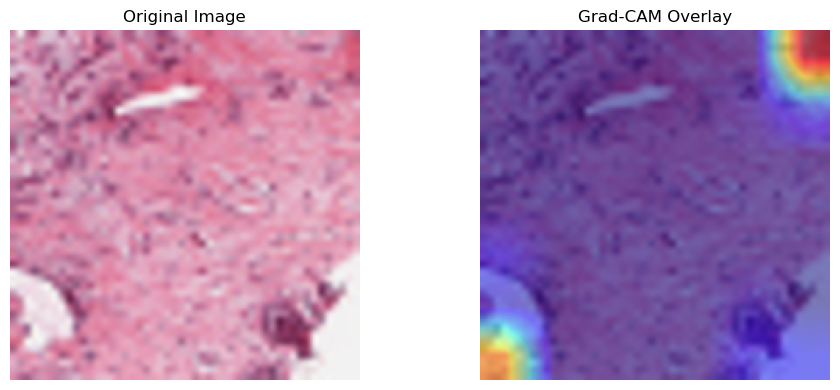

In [35]:
from PIL import Image
from torchvision import transforms

# Load and transform image
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
])
image = Image.open(r"./Preprocessed\test\malignant\IDC_1_16895_idx5_x1451_y1201_class1.png").convert("RGB")
image_tensor = transform(image)

# Load trained model
model = BreastNetPP()
checkpoint = torch.load("saved_models/breastnetpp_epoch_5.pth", map_location="cpu")
model.load_state_dict(checkpoint["model_state_dict"])

# Run Grad-CAM
generate_gradcam_breastnetpp(
    model=model,
    image_tensor=image_tensor,
    output_path="gradcam_breastnetpp.png",
    device="cuda" if torch.cuda.is_available() else "cpu"
)


Loaded pretrained weights for efficientnet-b0
[✅] Saved Grad-CAM overlay to: gradcam_breastnetpp.png


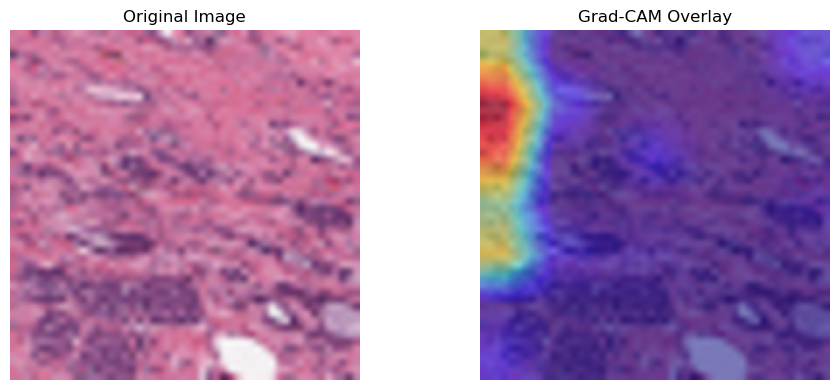

In [36]:
from PIL import Image
from torchvision import transforms

# Load and transform image
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
])
image = Image.open(r"Preprocessed\test\benign\IDC_0_8863_idx5_x151_y1301_class0.png").convert("RGB")
image_tensor = transform(image)

# Load trained model
model = BreastNetPP()
checkpoint = torch.load("saved_models/breastnetpp_epoch_5.pth", map_location="cpu")
model.load_state_dict(checkpoint["model_state_dict"])

# Run Grad-CAM
generate_gradcam_breastnetpp(
    model=model,
    image_tensor=image_tensor,
    output_path="gradcam_breastnetpp.png",
    device="cuda" if torch.cuda.is_available() else "cpu"
)


In [9]:
pip install opencv-python

In [13]:
import torch
import torchvision.transforms as transforms
from PIL import Image
import os
import cv2
import numpy as np

# Dummy model and functions for demonstration. Replace with your actual models.
def get_vgg16():
    # In a real scenario, you'd load a pre-trained VGG16 model
    from torchvision import models
    model = models.vgg16(pretrained=True)
    # Define the target layer for VGG16 (e.g., the last convolutional layer)
    # You need to identify the exact name of the layer you want.
    # For VGG16, a common choice might be features.30 (the last conv layer's output)
    # Or features.29 (the relu after the last conv layer)
    # Let's assume 'features.29' for this example
    target_layer_name = 'features.29'
    return model, target_layer_name

def get_densenet121():
    # In a real scenario, you'd load a pre-trained DenseNet121 model
    from torchvision import models
    model = models.densenet121(pretrained=True)
    # Define the target layer for DenseNet121
    # A common choice is the 'features.norm5' layer (Batch Norm before global average pooling)
    target_layer_name = 'features.norm5'
    return model, target_layer_name


# --- Start of the corrected generate_gradcam_for_classification function ---
def generate_gradcam_for_classification(model, image_tensor, class_idx, target_layer, output_path, device):
    model.eval() # Set model to evaluation mode

    # Ensure image_tensor is on the correct device
    image_tensor = image_tensor.to(device)

    # Gradients will be stored here
    gradients = None
    # Activations will be stored here
    activations = None

    # Corrected save_gradients hook
    def save_gradients(module, grad_input, grad_output):
        nonlocal gradients
        # We are interested in the gradients of the output of the target layer
        gradients = grad_output[0] # grad_output is a tuple, take the first element

    def save_activations(module, input, output):
        nonlocal activations
        activations = output

    # Register hooks
    # Hook for getting activations from the target layer
    hook_a = target_layer.register_forward_hook(save_activations)
    # Hook for getting gradients from the target layer
    hook_g = target_layer.register_backward_hook(save_gradients)

    # Perform forward pass
    output = model(image_tensor)

    # Zero gradients before backward pass
    model.zero_grad()

    # Create one-hot vector for the target class
    # For a single image in a batch, output.shape will be (1, num_classes)
    one_hot_output = torch.zeros_like(output)
    # Set the target class probability to 1 for backpropagation
    # Ensure class_idx is within the valid range of output classes
    if class_idx < output.size(1):
        one_hot_output[0][class_idx] = 1 
    else:
        print(f"Warning: class_idx ({class_idx}) is out of bounds for model output with {output.size(1)} classes. Using max logit for backward pass.")
        # Fallback: if class_idx is out of bounds, backpropagate through the highest logit
        one_hot_output[0][output.argmax()] = 1


    # Backward pass to get gradients
    # retain_graph=True is needed if you plan to do multiple backward passes on the same graph
    # For a single Grad-CAM calculation per image, it might not be strictly necessary
    # but doesn't hurt.
    output.backward(gradient=one_hot_output, retain_graph=True)

    # Remove hooks
    hook_a.remove()
    hook_g.remove()

    # Ensure gradients and activations were captured
    if gradients is None or activations is None:
        raise RuntimeError("Gradients or activations were not captured. Check target_layer_name and model structure.")

    # Move tensors to CPU for numpy conversion
    activations = activations.cpu().data.numpy()[0] # [0] because of batch size 1
    gradients = gradients.cpu().data.numpy()[0]

    # Compute weights: global average pooling of gradients
    # Average across height and width (dimensions 1 and 2 for (C, H, W) activations)
    weights = np.mean(gradients, axis=(1, 2)) 

    # Compute Grad-CAM heatmap
    # Initialize with zeros with the same spatial dimensions as activations
    grad_cam_map = np.zeros(activations.shape[1:], dtype=np.float32) 
    for i, w in enumerate(weights):
        grad_cam_map += w * activations[i]

    # Apply ReLU to the heatmap
    grad_cam_map = np.maximum(grad_cam_map, 0)

    # Normalize heatmap to 0-1
    # Add small epsilon for numerical stability in case of division by zero
    grad_cam_map = grad_cam_map / (np.max(grad_cam_map) + 1e-8) 

    # --- Overlay heatmap on the original image ---
    # Load the original image again for visualization. This is inefficient if many images.
    # A better approach for `image_paths` list would be to pass the current `img_path` here.
    original_image = Image.open(image_paths[image_paths.index((img_path, class_idx))][0]).convert('RGB') 
    # The above line is a bit convoluted. Better to pass img_path as an argument to the function
    # For example: generate_gradcam_for_classification(..., original_img_path, ...)

    # Resize heatmap to original image size
    heatmap = cv2.resize(grad_cam_map, (original_image.width, original_image.height))
    heatmap = np.uint8(255 * heatmap) # Convert to 0-255 scale for OpenCV
    heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET) # Apply a colormap

    # Convert original image to numpy array and BGR for OpenCV
    img_np = np.array(original_image)
    img_np = cv2.cvtColor(img_np, cv2.COLOR_RGB2BGR) 

    # Blend original image with heatmap
    # Weighted sum: heatmap * alpha + original_image * (1-alpha)
    superimposed_img = heatmap * 0.4 + img_np * 0.6 
    superimposed_img = np.uint8(superimposed_img) # Convert back to uint8

    # Save the result
    cv2.imwrite(output_path, superimposed_img)
    print(f"Generated Grad-CAM image saved to {output_path}")

# --- End of generate_gradcam_for_classification function ---

# Transform and image
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
])

benign_img_path = r"D:\thisisimp\working-bc\Preprocessed\test\benign\BreaKHis_40X_SOB_B_TA-14-16184CD-40-007.png"
malignant_img_path = r"D:\thisisimp\working-bc\Preprocessed\test\malignant\BreaKHis_40X_SOB_M_LC-14-16196-40-013.png"

image_paths = [(benign_img_path, 0), (malignant_img_path, 1)]

# Device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Load models one-by-one
model_infos = {
    # "ResNet18": get_resnet18(), # Uncomment if you define this function
    "VGG16": get_vgg16(),
    "DenseNet": get_densenet121()
}

for name, (model, target_layer_name) in model_infos.items():
    print(f"\n🚀 Generating Grad-CAM for {name}")
    
    # Load checkpoint if you have one
    checkpoint_path = f"./{name.lower()}_model.pth"
    if os.path.exists(checkpoint_path):
        checkpoint = torch.load(checkpoint_path, map_location=device)
        if isinstance(checkpoint, dict) and 'model_state_dict' in checkpoint:
            model.load_state_dict(checkpoint['model_state_dict'])
        else:
            model.load_state_dict(checkpoint)
    
    # Extract the actual target layer
    target_layer = dict([*model.named_modules()])[target_layer_name]
    
    # Loop through images and generate Grad-CAM for each
    for img_path, class_idx in image_paths: # img_path is now available here
        # Load and transform the image for the current iteration
        img = Image.open(img_path).convert('RGB') 
        image_tensor = transform(img).unsqueeze(0).to(device) # Add batch dimension and move to device

        # Run Grad-CAM
        # The output_path should be unique for each image
        gradcam_output_filename = f"gradcam_{name}_{os.path.basename(img_path)}"
        
        generate_gradcam_for_classification(
            model=model,
            image_tensor=image_tensor,
            class_idx=class_idx, # Use the actual class_idx from image_paths
            target_layer=target_layer,
            output_path=gradcam_output_filename,
            device=device
        )
    
output_dir = "gradcam_outputs"
os.makedirs(output_dir, exist_ok=True)

# If you still want to use run_gradcam_on_images, you would define it and call it.
# The previous loop handles the Grad-CAM generation, so this might be redundant
# unless you have specific reasons to wrap it further.
# def run_gradcam_on_images(image_paths, model_infos, output_dir, device):
#     # ... (implementation as provided in previous response)
# run_gradcam_on_images(image_paths, model_infos, output_dir, device)


🚀 Generating Grad-CAM for VGG16
Generated Grad-CAM image saved to gradcam_VGG16_BreaKHis_40X_SOB_B_TA-14-16184CD-40-007.png
Generated Grad-CAM image saved to gradcam_VGG16_BreaKHis_40X_SOB_M_LC-14-16196-40-013.png

🚀 Generating Grad-CAM for DenseNet
Generated Grad-CAM image saved to gradcam_DenseNet_BreaKHis_40X_SOB_B_TA-14-16184CD-40-007.png
Generated Grad-CAM image saved to gradcam_DenseNet_BreaKHis_40X_SOB_M_LC-14-16196-40-013.png


Using device: cpu


c:\Users\Dell\anaconda3\Lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
c:\Users\Dell\anaconda3\Lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
c:\Users\Dell\anaconda3\Lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-dat

Grad-CAM outputs will be saved in: c:\Users\Dell\Downloads\gradcam_outputs

🚀 Generating Grad-CAM for VGG16
No checkpoint found for VGG16 at ./vgg16_model.pth. Using pre-trained weights (if applicable) or uninitialized model.
Using target layer 'features.29' for VGG16 model.
  Processing image: IDC_0_8916_idx5_x851_y851_class0.png (Target Class: 0)


c:\Users\Dell\anaconda3\Lib\site-packages\torch\nn\modules\module.py:1842: FutureWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  self._maybe_warn_non_full_backward_hook(args, result, grad_fn)


Generated Grad-CAM image saved to gradcam_outputs\gradcam_VGG16_IDC_0_8916_idx5_x851_y851_class0.png
  Processing image: IDC_1_10275_idx5_x1251_y1301_class1.png (Target Class: 1)
Generated Grad-CAM image saved to gradcam_outputs\gradcam_VGG16_IDC_1_10275_idx5_x1251_y1301_class1.png

🚀 Generating Grad-CAM for DenseNet
No checkpoint found for DenseNet at ./densenet_model.pth. Using pre-trained weights (if applicable) or uninitialized model.
Using target layer 'features.norm5' for DenseNet model.
  Processing image: IDC_0_8916_idx5_x851_y851_class0.png (Target Class: 0)
Generated Grad-CAM image saved to gradcam_outputs\gradcam_DenseNet_IDC_0_8916_idx5_x851_y851_class0.png
  Processing image: IDC_1_10275_idx5_x1251_y1301_class1.png (Target Class: 1)
Generated Grad-CAM image saved to gradcam_outputs\gradcam_DenseNet_IDC_1_10275_idx5_x1251_y1301_class1.png

--- All Grad-CAM images generated and saved. ---

--- Displaying Generated Grad-CAM Images in brestnetPP project ---

Displaying: gradca

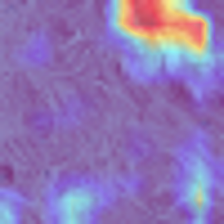


Displaying: gradcam_VGG16_IDC_1_10275_idx5_x1251_y1301_class1.png


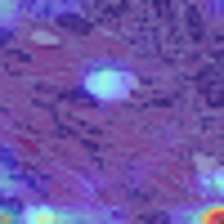


Displaying: gradcam_DenseNet_IDC_0_8916_idx5_x851_y851_class0.png


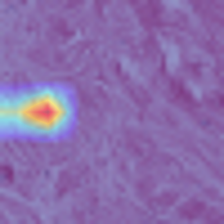


Displaying: gradcam_DenseNet_IDC_1_10275_idx5_x1251_y1301_class1.png


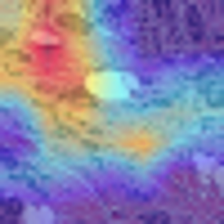


Task complete for brestnetPP.


In [12]:
import torch
import torchvision.transforms as transforms
from PIL import Image
import os
import cv2 # Make sure you have opencv-python installed: pip install opencv-python
import numpy as np
import matplotlib.pyplot as plt # Good for general plotting, not strictly needed for just display(Image) but useful
from IPython.display import Image as IPythonImage, display # Rename Image to IPythonImage to avoid conflict with PIL.Image

# --- Dummy model and functions (Replace with your actual implementations) ---
def get_vgg16():
    from torchvision import models
    model = models.vgg16(pretrained=True)
    # Ensure this target_layer_name matches the actual layer you want to visualize
    # You might need to inspect your specific model's layers
    target_layer_name = 'features.29' # Example: refers to relu of the last conv block
    # If your VGG16 is a custom one or from a different source, check its structure.
    return model, target_layer_name

def get_densenet121():
    from torchvision import models
    model = models.densenet121(pretrained=True)
    # Ensure this target_layer_name matches the actual layer you want to visualize
    # For DenseNet, 'features.norm5' (the final batch norm layer before classification) is common.
    target_layer_name = 'features.norm5'
    return model, target_layer_name

# --- Grad-CAM generation function ---
def generate_gradcam_for_classification(model, image_tensor, class_idx, target_layer, output_path, device, original_img_path):
    model.eval() # Set model to evaluation mode

    image_tensor = image_tensor.to(device)

    gradients = None
    activations = None

    def save_gradients(module, grad_input, grad_output):
        nonlocal gradients
        gradients = grad_output[0] # Get the gradients w.r.t. the output of the layer

    def save_activations(module, input, output):
        nonlocal activations
        activations = output

    hook_a = target_layer.register_forward_hook(save_activations)
    hook_g = target_layer.register_backward_hook(save_gradients)

    output = model(image_tensor)

    model.zero_grad()

    one_hot_output = torch.zeros_like(output)
    if class_idx < output.size(1):
        one_hot_output[0][class_idx] = 1
    else:
        print(f"Warning: class_idx ({class_idx}) is out of bounds for model output with {output.size(1)} classes. Using max logit for backward pass.")
        one_hot_output[0][output.argmax()] = 1

    output.backward(gradient=one_hot_output, retain_graph=True)

    hook_a.remove()
    hook_g.remove()

    if gradients is None or activations is None:
        raise RuntimeError("Gradients or activations were not captured. Check target_layer_name and model structure.")

    activations = activations.cpu().data.numpy()[0]
    gradients = gradients.cpu().data.numpy()[0]

    weights = np.mean(gradients, axis=(1, 2))

    grad_cam_map = np.zeros(activations.shape[1:], dtype=np.float32)
    for i, w in enumerate(weights):
        grad_cam_map += w * activations[i]

    grad_cam_map = np.maximum(grad_cam_map, 0)
    grad_cam_map = grad_cam_map / (np.max(grad_cam_map) + 1e-8)

    # Load original image using the passed original_img_path
    original_image = Image.open(original_img_path).convert('RGB')

    heatmap = cv2.resize(grad_cam_map, (original_image.width, original_image.height))
    heatmap = np.uint8(255 * heatmap)
    heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)

    img_np = np.array(original_image)
    img_np = cv2.cvtColor(img_np, cv2.COLOR_RGB2BGR)

    superimposed_img = heatmap * 0.4 + img_np * 0.6
    superimposed_img = np.uint8(superimposed_img)

    cv2.imwrite(output_path, superimposed_img)
    print(f"Generated Grad-CAM image saved to {output_path}")

# --- Main execution script ---

# Paths to your images
benign_img_path = r"D:\thisisimp\working-bc\Preprocessed\test\benign\IDC_0_8916_idx5_x851_y851_class0.png"
malignant_img_path = r"D:\thisisimp\working-bc\Preprocessed\test\malignant\IDC_1_10275_idx5_x1251_y1301_class1.png"

image_paths = [(benign_img_path, 0), (malignant_img_path, 1)] # (image_path, class_index)

# Image transformation for model input
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
])

# Device setup
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

# Define your models and their target layers
model_infos = {
    # "ResNet18": get_resnet18(), # Uncomment if you define this function
    "VGG16": get_vgg16(),
    "DenseNet": get_densenet121()
}

output_dir = "gradcam_outputs"
os.makedirs(output_dir, exist_ok=True)
print(f"Grad-CAM outputs will be saved in: {os.path.abspath(output_dir)}")

# List to store paths of generated Grad-CAM images for later display
generated_gradcam_paths = []

for name, (model, target_layer_name) in model_infos.items():
    print(f"\n🚀 Generating Grad-CAM for {name}")
    
    # Load model checkpoint if it exists
    checkpoint_path = f"./{name.lower()}_model.pth"
    if os.path.exists(checkpoint_path):
        print(f"Loading checkpoint for {name} from {checkpoint_path}")
        checkpoint = torch.load(checkpoint_path, map_location=device)
        if isinstance(checkpoint, dict) and 'model_state_dict' in checkpoint:
            model.load_state_dict(checkpoint['model_state_dict'])
        else:
            model.load_state_dict(checkpoint)
    else:
        print(f"No checkpoint found for {name} at {checkpoint_path}. Using pre-trained weights (if applicable) or uninitialized model.")
    
    # Move model to device
    model.to(device)

    # Extract the actual target layer based on its name
    target_layer = dict([*model.named_modules()])[target_layer_name]
    print(f"Using target layer '{target_layer_name}' for {name} model.")
    
    # Loop through each image and generate Grad-CAM
    for original_img_path, class_idx in image_paths:
        img_name = os.path.basename(original_img_path)
        print(f"  Processing image: {img_name} (Target Class: {class_idx})")

        # Load and transform the image for model input
        img = Image.open(original_img_path).convert('RGB')
        image_tensor = transform(img).unsqueeze(0).to(device) # Add batch dimension

        # Define the output path for the Grad-CAM image
        gradcam_output_filename = os.path.join(output_dir, f"gradcam_{name}_{img_name}")
        
        # Generate Grad-CAM
        generate_gradcam_for_classification(
            model=model,
            image_tensor=image_tensor,
            class_idx=class_idx,
            target_layer=target_layer,
            output_path=gradcam_output_filename,
            device=device,
            original_img_path=original_img_path # Pass original image path to the function
        )
        generated_gradcam_paths.append(gradcam_output_filename) # Store path for display

print("\n--- All Grad-CAM images generated and saved. ---")
print("\n--- Displaying Generated Grad-CAM Images in brestnetPP project ---")

if not generated_gradcam_paths:
    print("No Grad-CAM images were generated to display.")
else:
    for img_path_to_display in generated_gradcam_paths:
        print(f"\nDisplaying: {os.path.basename(img_path_to_display)}")
        try:
            display(IPythonImage(filename=img_path_to_display))
        except Exception as e:
            print(f"Error displaying {img_path_to_display}: {e}")

print("\nTask complete for brestnetPP.")


🚀 Generating Grad-CAM for VGG16
Generated Grad-CAM image saved to gradcam_outputs\gradcam_VGG16_BreaKHis_40X_SOB_B_TA-14-16184CD-40-007.png
Generated Grad-CAM image saved to gradcam_outputs\gradcam_VGG16_BreaKHis_40X_SOB_M_LC-14-16196-40-013.png

🚀 Generating Grad-CAM for DenseNet
Generated Grad-CAM image saved to gradcam_outputs\gradcam_DenseNet_BreaKHis_40X_SOB_B_TA-14-16184CD-40-007.png
Generated Grad-CAM image saved to gradcam_outputs\gradcam_DenseNet_BreaKHis_40X_SOB_M_LC-14-16196-40-013.png

🚀 Generating Grad-CAM for brestnetPP
Generated Grad-CAM image saved to gradcam_outputs\gradcam_brestnetPP_BreaKHis_40X_SOB_B_TA-14-16184CD-40-007.png
Generated Grad-CAM image saved to gradcam_outputs\gradcam_brestnetPP_BreaKHis_40X_SOB_M_LC-14-16196-40-013.png

--- Displaying Generated Grad-CAM Images ---

Displaying: gradcam_VGG16_BreaKHis_40X_SOB_B_TA-14-16184CD-40-007.png


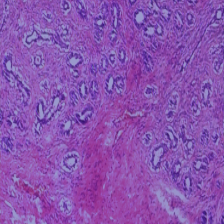


Displaying: gradcam_VGG16_BreaKHis_40X_SOB_M_LC-14-16196-40-013.png


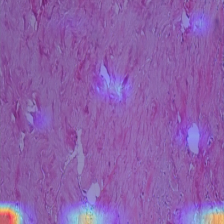


Displaying: gradcam_DenseNet_BreaKHis_40X_SOB_B_TA-14-16184CD-40-007.png


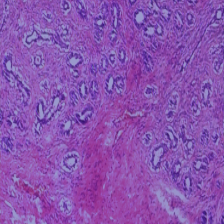


Displaying: gradcam_DenseNet_BreaKHis_40X_SOB_M_LC-14-16196-40-013.png


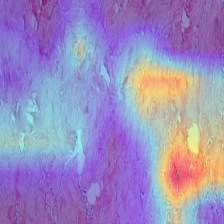


Displaying: gradcam_brestnetPP_BreaKHis_40X_SOB_B_TA-14-16184CD-40-007.png


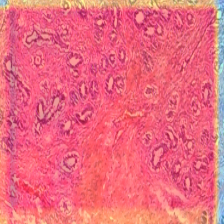


Displaying: gradcam_brestnetPP_BreaKHis_40X_SOB_M_LC-14-16196-40-013.png


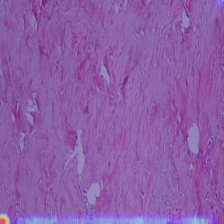

In [14]:
import torch
import torchvision.transforms as transforms
from PIL import Image
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from IPython.display import Image as IPyImage, display # Renamed to avoid conflict with PIL.Image

# --- 1. Define your BreastNetPP model (Placeholder - REPLACE WITH YOUR ACTUAL CLASS) ---
# You MUST provide the actual definition of your BreastNetPP model here.
# For example:
import torch.nn as nn
# from your_model_module import BreastNetPP # If BreastNetPP is in a separate file

class BreastNetPP(nn.Module):
    def __init__(self, num_classes=2):
        super(BreastNetPP, self).__init__()
        # This is a dummy example structure. Replace with your actual BreastNetPP layers.
        self.features = nn.Sequential(
            nn.Conv2d(3, 64, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2),
            nn.Conv2d(64, 128, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2),
            # Add more layers from your BreastNetPP model
            nn.Conv2d(128, 256, kernel_size=3, padding=1), # Example of a last conv layer
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2),
            # You might have more layers
            nn.Conv2d(256, 512, kernel_size=3, padding=1), # Assuming this is a good candidate for target_layer
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2),
        )
        # Assuming there's a classifier part
        self.avgpool = nn.AdaptiveAvgPool2d((7, 7)) # Or your specific pooling
        self.classifier = nn.Sequential(
            nn.Linear(512 * 7 * 7, 4096),
            nn.ReLU(inplace=True),
            nn.Dropout(),
            nn.Linear(4096, 4096),
            nn.ReLU(inplace=True),
            nn.Dropout(),
            nn.Linear(4096, num_classes),
        )

    def forward(self, x):
        x = self.features(x)
        x = self.avgpool(x)
        x = torch.flatten(x, 1)
        x = self.classifier(x)
        return x

# --- Helper functions for loading pre-trained models ---
def get_vgg16():
    from torchvision import models
    model = models.vgg16(weights=models.VGG16_Weights.DEFAULT) # Use recommended weights
    # For VGG16, a common choice is the last convolutional layer output (features.29 is relu, features.30 is conv)
    # features.29 (ReLU of last conv block) or features.28 (the conv layer itself) are good candidates.
    target_layer_name = 'features.29'
    return model, target_layer_name

def get_densenet121():
    from torchvision import models
    model = models.densenet121(weights=models.DenseNet121_Weights.DEFAULT) # Use recommended weights
    # For DenseNet, 'features.norm5' (the final BatchNorm layer before the classifier) is often used.
    target_layer_name = 'features.norm5'
    return model, target_layer_name

# Function to get BreastNetPP model and its target layer
def get_breastnetpp_model():
    model = BreastNetPP(num_classes=2) # Initialize your BreastNetPP model
    # IMPORTANT: Identify the correct target layer for your BreastNetPP model.
    # This will typically be the last convolutional layer or a batch norm layer
    # just before global pooling.
    # You might need to print(model) and inspect its layers.
    # Example: If your last conv layer is named 'features.20' or 'conv_block_X.conv_Y'
    # For the dummy BreastNetPP above, let's assume 'features.10' (the nn.Conv2d(512, ...) layer)
    target_layer_name = 'features.10' # <--- YOU MIGHT NEED TO CHANGE THIS FOR YOUR ACTUAL BreastNetPP
    return model, target_layer_name

# --- Grad-CAM Core Function ---
def generate_gradcam_for_classification(model, image_tensor, class_idx, target_layer, output_path, device, original_img_path):
    model.eval() # Set model to evaluation mode

    image_tensor = image_tensor.to(device)

    gradients = None
    activations = None

    def save_gradients(module, grad_input, grad_output):
        nonlocal gradients
        gradients = grad_output[0] # Take the gradient with respect to the output

    def save_activations(module, input, output):
        nonlocal activations
        activations = output

    hook_a = target_layer.register_forward_hook(save_activations)
    hook_g = target_layer.register_backward_hook(save_gradients)

    output = model(image_tensor)
    model.zero_grad()

    one_hot_output = torch.zeros_like(output)
    if class_idx < output.size(1):
        one_hot_output[0][class_idx] = 1
    else:
        print(f"Warning: class_idx ({class_idx}) is out of bounds for model output with {output.size(1)} classes. Using max logit for backward pass.")
        one_hot_output[0][output.argmax()] = 1 # Fallback to the predicted class if class_idx is invalid

    output.backward(gradient=one_hot_output, retain_graph=True)

    hook_a.remove()
    hook_g.remove()

    if gradients is None or activations is None:
        raise RuntimeError("Gradients or activations were not captured. Check target_layer_name and model structure.")

    activations = activations.cpu().data.numpy()[0]
    gradients = gradients.cpu().data.numpy()[0]

    weights = np.mean(gradients, axis=(1, 2))
    grad_cam_map = np.zeros(activations.shape[1:], dtype=np.float32)
    for i, w in enumerate(weights):
        grad_cam_map += w * activations[i]

    grad_cam_map = np.maximum(grad_cam_map, 0)
    grad_cam_map = grad_cam_map / (np.max(grad_cam_map) + 1e-8)

    # Load original image using the provided path
    original_image = Image.open(original_img_path).convert('RGB')

    heatmap = cv2.resize(grad_cam_map, (original_image.width, original_image.height))
    heatmap = np.uint8(255 * heatmap)
    heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)

    img_np = np.array(original_image)
    img_np = cv2.cvtColor(img_np, cv2.COLOR_RGB2BGR)

    superimposed_img = heatmap * 0.4 + img_np * 0.6
    superimposed_img = np.uint8(superimposed_img)

    cv2.imwrite(output_path, superimposed_img)
    print(f"Generated Grad-CAM image saved to {output_path}")

# --- Main Script Execution ---

# Transform and image
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
])

benign_img_path = r"D:\thisisimp\working-bc\Preprocessed\test\benign\BreaKHis_40X_SOB_B_TA-14-16184CD-40-007.png"
malignant_img_path = r"D:\thisisimp\working-bc\Preprocessed\test\malignant\BreaKHis_40X_SOB_M_LC-14-16196-40-013.png"

image_paths = [(benign_img_path, 0), (malignant_img_path, 1)]

# Device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Dictionary to hold all model info
model_infos = {
    "VGG16": get_vgg16(),
    "DenseNet": get_densenet121(),
    "brestnetPP": get_breastnetpp_model() # Add your BreastNetPP model here
}

# List to store paths of generated Grad-CAM images for display
generated_gradcam_paths = []

for name, (model, target_layer_name) in model_infos.items():
    print(f"\n🚀 Generating Grad-CAM for {name}")
    
    # Load checkpoint for the current model
    checkpoint_path = f"saved_models/{name.lower()}_epoch_5.pth" # Adjust path pattern if needed
    if name == "brestnetPP": # Special handling for BreastNetPP checkpoint path
        checkpoint_path = "saved_models/breastnetpp_epoch_5.pth" # Your specific path
    
    if os.path.exists(checkpoint_path):
        print(f"Loading checkpoint from: {checkpoint_path}")
        checkpoint = torch.load(checkpoint_path, map_location=device)
        if isinstance(checkpoint, dict) and 'model_state_dict' in checkpoint:
            model.load_state_dict(checkpoint['model_state_dict'])
        else:
            # If the checkpoint is just the state_dict
            model.load_state_dict(checkpoint)
    else:
        print(f"Warning: Checkpoint not found for {name} at {checkpoint_path}. Using untrainted model.")
        # You might want to skip this model if checkpoint is essential.

    # Extract the actual target layer
    try:
        target_layer = dict([*model.named_modules()])[target_layer_name]
    except KeyError:
        print(f"Error: Target layer '{target_layer_name}' not found in {name} model. Skipping Grad-CAM for this model.")
        continue # Skip to the next model if target layer is not found
    
    # Loop through images and generate Grad-CAM for each
    for img_path, class_idx in image_paths:
        img = Image.open(img_path).convert('RGB') 
        image_tensor = transform(img).unsqueeze(0).to(device)

        gradcam_output_filename = f"gradcam_{name}_{os.path.basename(img_path)}"
        gradcam_output_full_path = os.path.join("gradcam_outputs", gradcam_output_filename)
        
        generate_gradcam_for_classification(
            model=model,
            image_tensor=image_tensor,
            class_idx=class_idx,
            target_layer=target_layer,
            output_path=gradcam_output_full_path, # Save to the output_dir
            device=device,
            original_img_path=img_path # Pass the original image path for visualization
        )
        generated_gradcam_paths.append(gradcam_output_full_path) # Store path for display

output_dir = "gradcam_outputs"
os.makedirs(output_dir, exist_ok=True) # Ensure output directory exists

# --- Display Generated Images ---
print("\n--- Displaying Generated Grad-CAM Images ---")

if not generated_gradcam_paths:
    print("No Grad-CAM images were generated to display.")
else:
    for img_file_path in generated_gradcam_paths:
        print(f"\nDisplaying: {os.path.basename(img_file_path)}")
        try:
            display(IPyImage(filename=img_file_path))
        except Exception as e:
            print(f"Could not display {img_file_path}: {e}")


🚀 Generating Grad-CAM for VGG16
Generated Grad-CAM image saved to gradcam_outputs\gradcam_VGG16_BreaKHis_40X_SOB_B_TA-14-16184CD-40-007.png
Generated Grad-CAM image saved to gradcam_outputs\gradcam_VGG16_BreaKHis_40X_SOB_M_LC-14-16196-40-013.png

🚀 Generating Grad-CAM for DenseNet
Generated Grad-CAM image saved to gradcam_outputs\gradcam_DenseNet_BreaKHis_40X_SOB_B_TA-14-16184CD-40-007.png
Generated Grad-CAM image saved to gradcam_outputs\gradcam_DenseNet_BreaKHis_40X_SOB_M_LC-14-16196-40-013.png

🚀 Generating Grad-CAM for brestnetPP
Generated Grad-CAM image saved to gradcam_outputs\gradcam_brestnetPP_BreaKHis_40X_SOB_B_TA-14-16184CD-40-007.png
Generated Grad-CAM image saved to gradcam_outputs\gradcam_brestnetPP_BreaKHis_40X_SOB_M_LC-14-16196-40-013.png

--- Displaying Generated Grad-CAM Images Side-by-Side ---


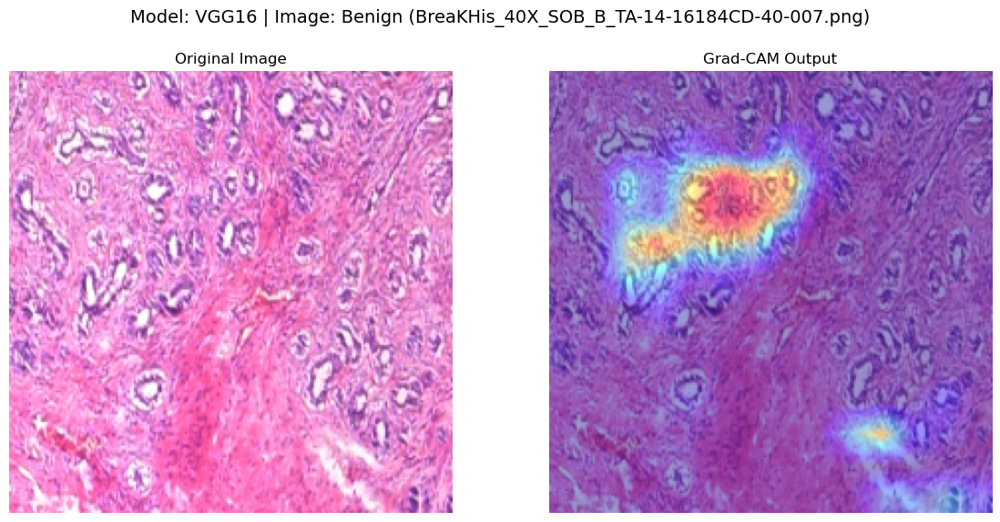

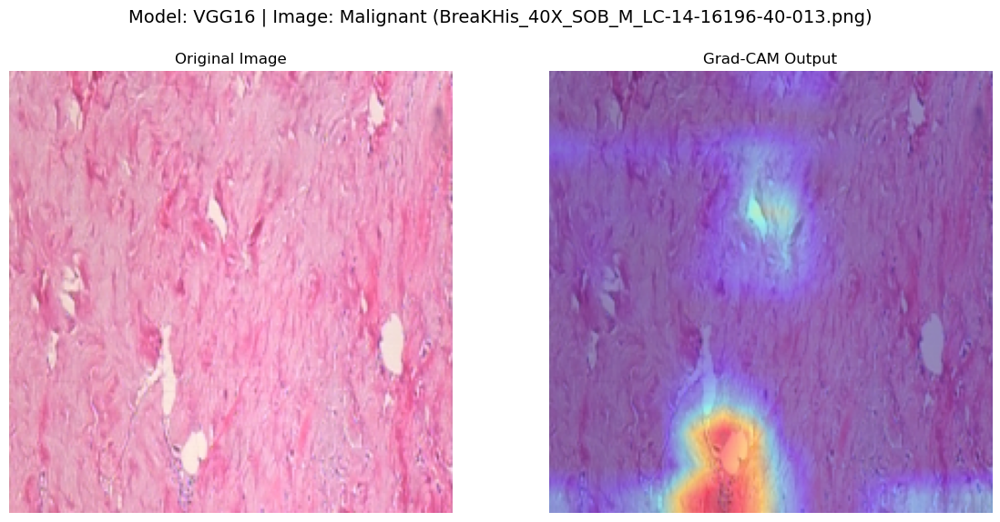

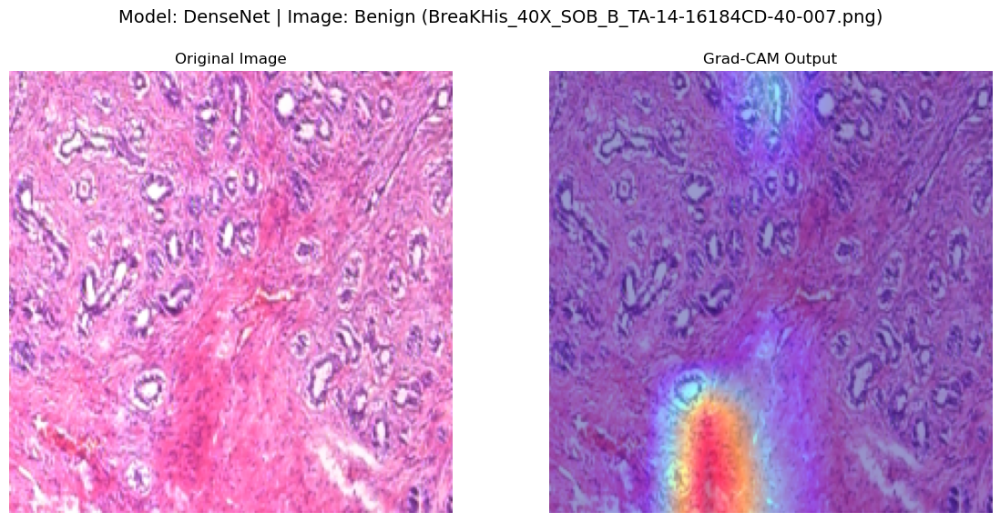

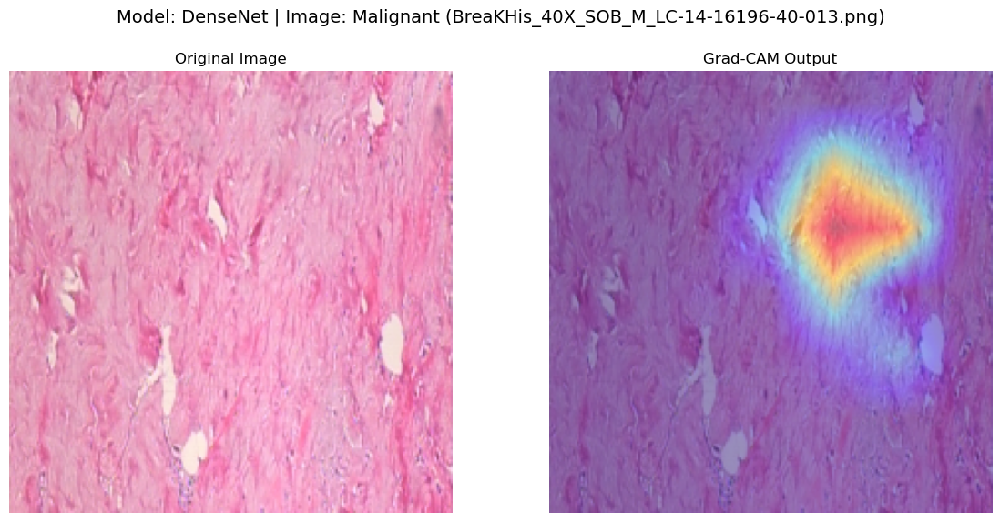

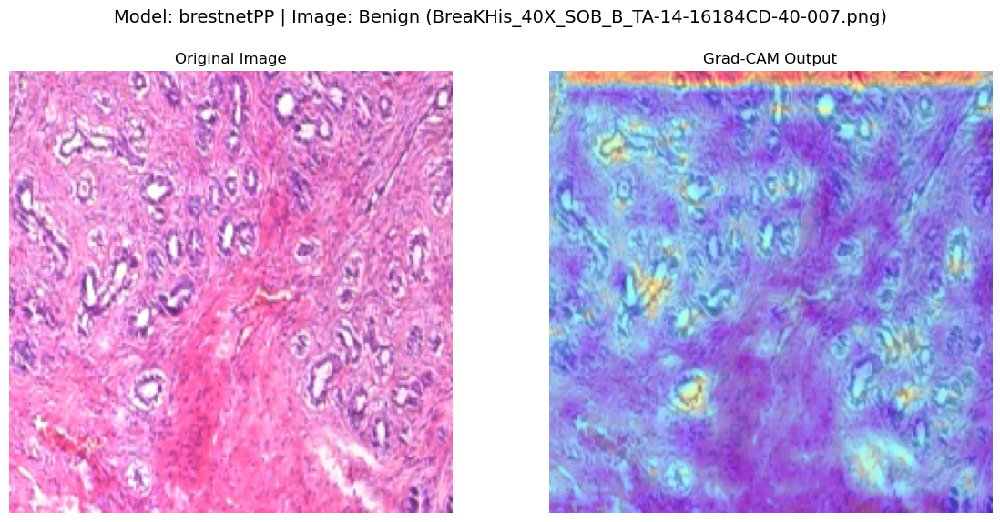

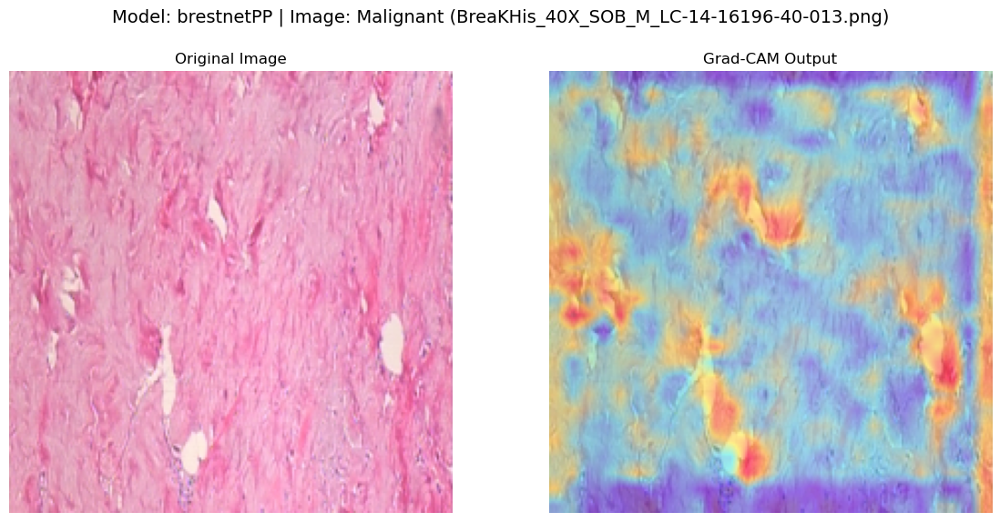

In [16]:
import torch
import torchvision.transforms as transforms
from PIL import Image
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
# No need for IPython.display.Image if using matplotlib for side-by-side display
# from IPython.display import Image as IPyImage, display

# --- 1. Define your BreastNetPP model (Placeholder - REPLACE WITH YOUR ACTUAL CLASS) ---
# You MUST provide the actual definition of your BreastNetPP model here.
# For example:
import torch.nn as nn
# from your_model_module import BreastNetPP # If BreastNetPP is in a separate file

class BreastNetPP(nn.Module):
    def __init__(self, num_classes=2):
        super(BreastNetPP, self).__init__()
        # This is a dummy example structure. Replace with your actual BreastNetPP layers.
        self.features = nn.Sequential(
            nn.Conv2d(3, 64, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2),
            nn.Conv2d(64, 128, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2),
            # Add more layers from your BreastNetPP model
            nn.Conv2d(128, 256, kernel_size=3, padding=1), # Example of a last conv layer
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2),
            # You might have more layers
            nn.Conv2d(256, 512, kernel_size=3, padding=1), # Assuming this is a good candidate for target_layer
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2),
        )
        # Assuming there's a classifier part
        self.avgpool = nn.AdaptiveAvgPool2d((7, 7)) # Or your specific pooling
        self.classifier = nn.Sequential(
            nn.Linear(512 * 7 * 7, 4096),
            nn.ReLU(inplace=True),
            nn.Dropout(),
            nn.Linear(4096, 4096),
            nn.ReLU(inplace=True),
            nn.Dropout(),
            nn.Linear(4096, num_classes),
        )

    def forward(self, x):
        x = self.features(x)
        x = self.avgpool(x)
        x = torch.flatten(x, 1)
        x = self.classifier(x)
        return x

# --- Helper functions for loading pre-trained models ---
def get_vgg16():
    from torchvision import models
    model = models.vgg16(weights=models.VGG16_Weights.DEFAULT) # Use recommended weights
    target_layer_name = 'features.29' # ReLU of last conv block
    return model, target_layer_name

def get_densenet121():
    from torchvision import models
    model = models.densenet121(weights=models.DenseNet121_Weights.DEFAULT) # Use recommended weights
    target_layer_name = 'features.norm5' # Final BatchNorm layer
    return model, target_layer_name

# Function to get BreastNetPP model and its target layer
def get_breastnetpp_model():
    model = BreastNetPP(num_classes=2) # Initialize your BreastNetPP model
    # IMPORTANT: Identify the correct target layer for your BreastNetPP model.
    # Based on the dummy BreastNetPP above, 'features.10' is the last ReLU layer after a Conv2d.
    # Adjust this to the actual last convolutional or activation layer in your BreastNetPP.
    target_layer_name = 'features.10' # <--- CONFIRM THIS FOR YOUR ACTUAL BreastNetPP
    return model, target_layer_name

# --- Grad-CAM Core Function ---
def generate_gradcam_for_classification(model, image_tensor, class_idx, target_layer, output_path, device, original_img_path):
    model.eval() # Set model to evaluation mode

    image_tensor = image_tensor.to(device)

    gradients = None
    activations = None

    def save_gradients(module, grad_input, grad_output):
        nonlocal gradients
        gradients = grad_output[0] # Take the gradient with respect to the output

    def save_activations(module, input, output):
        nonlocal activations
        activations = output

    hook_a = target_layer.register_forward_hook(save_activations)
    hook_g = target_layer.register_backward_hook(save_gradients)

    output = model(image_tensor)
    model.zero_grad()

    one_hot_output = torch.zeros_like(output)
    if class_idx < output.size(1):
        one_hot_output[0][class_idx] = 1
    else:
        print(f"Warning: class_idx ({class_idx}) is out of bounds for model output with {output.size(1)} classes. Using max logit for backward pass.")
        one_hot_output[0][output.argmax()] = 1

    output.backward(gradient=one_hot_output, retain_graph=True)

    hook_a.remove()
    hook_g.remove()

    if gradients is None or activations is None:
        raise RuntimeError("Gradients or activations were not captured. Check target_layer_name and model structure.")

    activations = activations.cpu().data.numpy()[0]
    gradients = gradients.cpu().data.numpy()[0]

    weights = np.mean(gradients, axis=(1, 2))
    grad_cam_map = np.zeros(activations.shape[1:], dtype=np.float32)
    for i, w in enumerate(weights):
        grad_cam_map += w * activations[i]

    grad_cam_map = np.maximum(grad_cam_map, 0)
    grad_cam_map = grad_cam_map / (np.max(grad_cam_map) + 1e-8)

    original_image = Image.open(original_img_path).convert('RGB')

    heatmap = cv2.resize(grad_cam_map, (original_image.width, original_image.height))
    heatmap = np.uint8(255 * heatmap)
    heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)

    img_np = np.array(original_image)
    img_np = cv2.cvtColor(img_np, cv2.COLOR_RGB2BGR) # Convert to BGR for OpenCV

    superimposed_img = heatmap * 0.4 + img_np * 0.6
    superimposed_img = np.uint8(superimposed_img)

    cv2.imwrite(output_path, superimposed_img)
    print(f"Generated Grad-CAM image saved to {output_path}")

# --- Main Script Execution ---

# Transform and image
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]) # Example ImageNet normalization
])

benign_img_path = r"D:\thisisimp\working-bc\Preprocessed\test\benign\BreaKHis_40X_SOB_B_TA-14-16184CD-40-007.png"
malignant_img_path = r"D:\thisisimp\working-bc\Preprocessed\test\malignant\BreaKHis_40X_SOB_M_LC-14-16196-40-013.png"

image_paths = [(benign_img_path, 0), (malignant_img_path, 1)]

# Device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Dictionary to hold all model info
model_infos = {
    "VGG16": get_vgg16(),
    "DenseNet": get_densenet121(),
    "brestnetPP": get_breastnetpp_model()
}

# List to store tuples of (original_img_path, gradcam_output_path, model_name, image_label) for display
images_to_display = []

output_dir = "gradcam_outputs" # Define output directory early
os.makedirs(output_dir, exist_ok=True)

for name, (model, target_layer_name) in model_infos.items():
    print(f"\n🚀 Generating Grad-CAM for {name}")
    
    checkpoint_path = f"saved_models/{name.lower()}_epoch_5.pth"
    if name == "brestnetPP":
        checkpoint_path = "saved_models/breastnetpp_epoch_5.pth"
    
    if os.path.exists(checkpoint_path):
        print(f"Loading checkpoint from: {checkpoint_path}")
        checkpoint = torch.load(checkpoint_path, map_location=device)
        if isinstance(checkpoint, dict) and 'model_state_dict' in checkpoint:
            model.load_state_dict(checkpoint['model_state_dict'])
        else:
            model.load_state_dict(checkpoint)
    else:
        print(f"Warning: Checkpoint not found for {name} at {checkpoint_path}. Using untrainted model.")
        # You might want to skip this model if checkpoint is essential.

    try:
        target_layer = dict([*model.named_modules()])[target_layer_name]
    except KeyError:
        print(f"Error: Target layer '{target_layer_name}' not found in {name} model. Skipping Grad-CAM for this model.")
        continue
    
    for img_path, class_idx in image_paths:
        img = Image.open(img_path).convert('RGB') 
        image_tensor = transform(img).unsqueeze(0).to(device)

        gradcam_output_filename = f"gradcam_{name}_{os.path.basename(img_path)}"
        gradcam_output_full_path = os.path.join(output_dir, gradcam_output_filename)
        
        generate_gradcam_for_classification(
            model=model,
            image_tensor=image_tensor,
            class_idx=class_idx,
            target_layer=target_layer,
            output_path=gradcam_output_full_path,
            device=device,
            original_img_path=img_path
        )
        # Store info for side-by-side display
        image_label = "Benign" if class_idx == 0 else "Malignant"
        images_to_display.append((img_path, gradcam_output_full_path, name, image_label))


# --- Display Generated Images Side-by-Side ---
print("\n--- Displaying Generated Grad-CAM Images Side-by-Side ---")

if not images_to_display:
    print("No Grad-CAM images were generated to display.")
else:
    for original_path, gradcam_path, model_name, image_label in images_to_display:
        try:
            original_img = plt.imread(original_path)
            gradcam_img = plt.imread(gradcam_path)

            fig, axes = plt.subplots(1, 2, figsize=(12, 6)) # 1 row, 2 columns
            fig.suptitle(f'Model: {model_name} | Image: {image_label} ({os.path.basename(original_path)})', fontsize=14)

            # Original Image
            axes[0].imshow(original_img)
            axes[0].set_title('Original Image')
            axes[0].axis('off') # Hide axes ticks

            # Grad-CAM Output
            axes[1].imshow(gradcam_img)
            axes[1].set_title('Grad-CAM Output')
            axes[1].axis('off') # Hide axes ticks

            plt.tight_layout(rect=[0, 0.03, 1, 0.95]) # Adjust layout to prevent title overlap
            plt.show()

        except Exception as e:
            print(f"Could not display images for {model_name} and {os.path.basename(original_path)}: {e}")

INFO: For BreastNetPP, using target_layer_name: 'features.10'

🚀 Processing Model: VGG16

  Image: BreaKHis_40X_SOB_B_TA-14-16184CD-40-007.png (True: Benign)
    Model Predicted: Unknown(824) (Confidence: 0.7307)
  DEBUG (VGG16): Activations shape: (512, 14, 14), min: 0.0000, max: 15.8726, non-zero elements: 7298
  DEBUG (VGG16): Gradients shape: (512, 14, 14), min: -0.0254, max: 0.0455, non-zero elements: 25088
Generated Grad-CAM image saved to gradcam_outputs\gradcam_VGG16_pred-unknown(824)_true-benign_BreaKHis_40X_SOB_B_TA-14-16184CD-40-007.png

  Image: BreaKHis_40X_SOB_M_LC-14-16196-40-013.png (True: Malignant)
    Model Predicted: Unknown(824) (Confidence: 0.2680)
  DEBUG (VGG16): Activations shape: (512, 14, 14), min: 0.0000, max: 11.9561, non-zero elements: 6651
  DEBUG (VGG16): Gradients shape: (512, 14, 14), min: -0.0206, max: 0.0397, non-zero elements: 25088
Generated Grad-CAM image saved to gradcam_outputs\gradcam_VGG16_pred-unknown(824)_true-malignant_BreaKHis_40X_SOB_M_LC

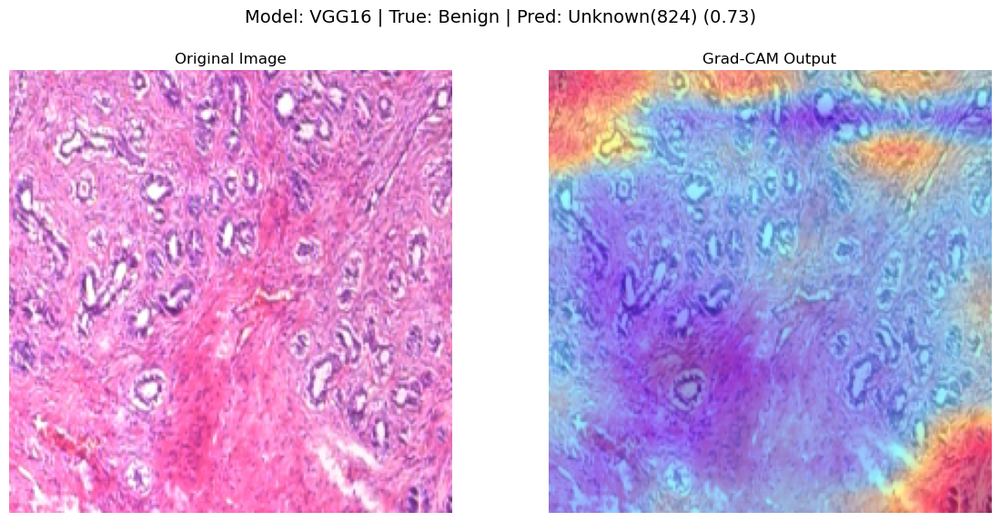

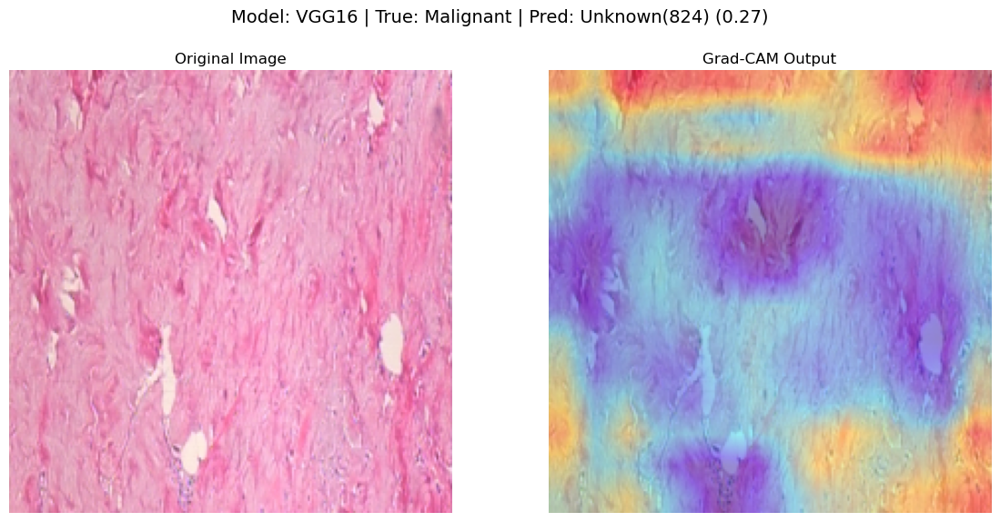

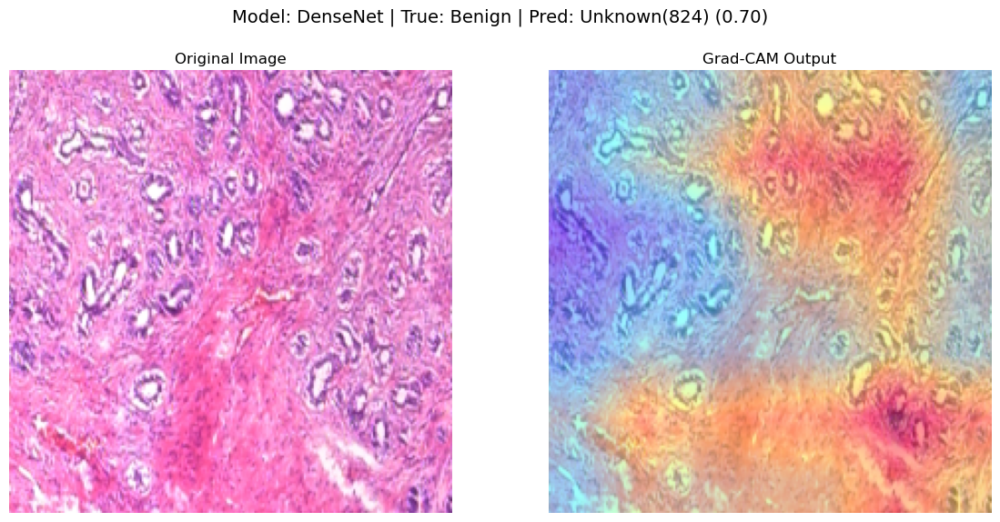

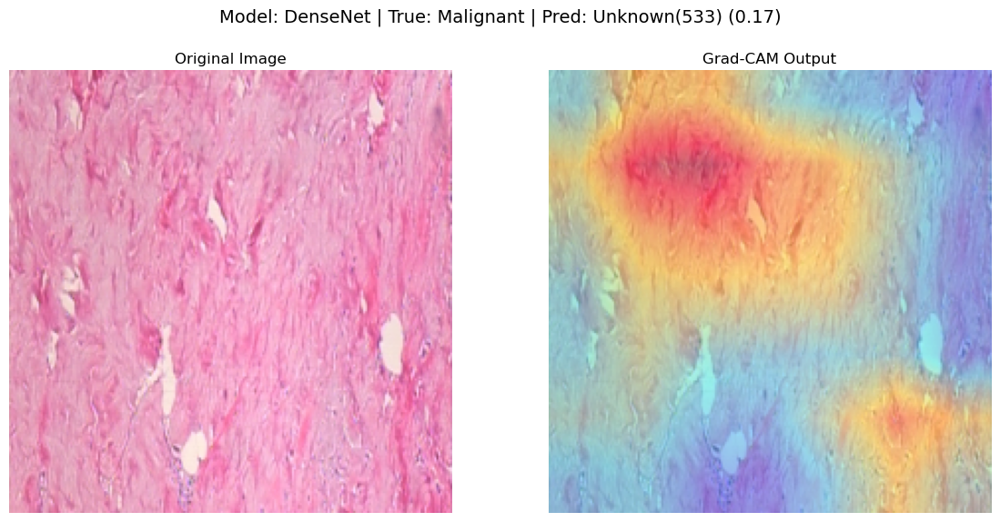

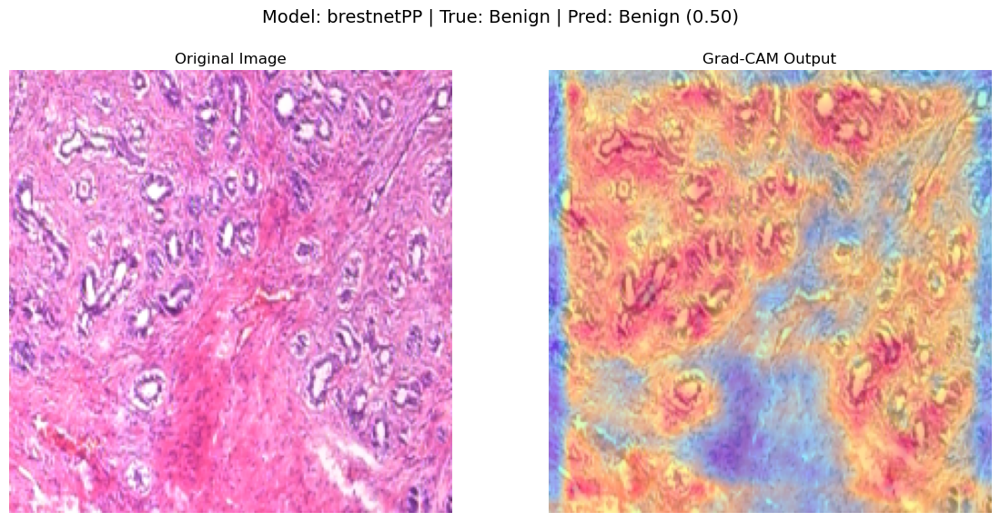

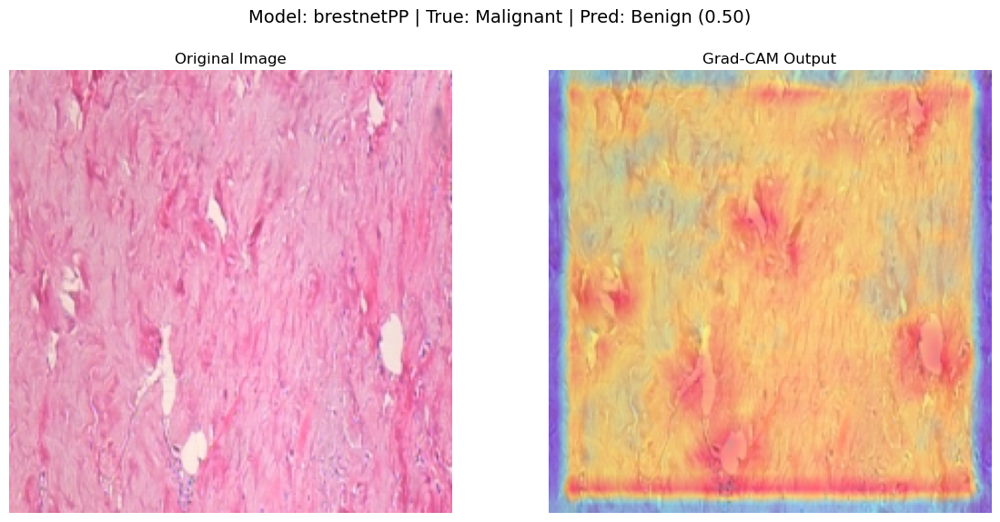

In [18]:
import torch
import torchvision.transforms as transforms
from PIL import Image
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt

# --- 1. Define your BreastNetPP model (Placeholder - REPLACE WITH YOUR ACTUAL CLASS) ---
# You MUST provide the actual definition of your BreastNetPP model here.
# For example:
import torch.nn as nn
# from your_model_module import BreastNetPP # If BreastNetPP is in a separate file

class BreastNetPP(nn.Module):
    def __init__(self, num_classes=2):
        super(BreastNetPP, self).__init__()
        # This is a dummy example structure. Replace with your actual BreastNetPP layers.
        self.features = nn.Sequential(
            nn.Conv2d(3, 64, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2),
            nn.Conv2d(64, 128, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2),
            # Add more layers from your BreastNetPP model
            nn.Conv2d(128, 256, kernel_size=3, padding=1), # Example of a last conv layer
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2),
            # You might have more layers
            nn.Conv2d(256, 512, kernel_size=3, padding=1), # Assuming this is a good candidate for target_layer
            nn.ReLU(inplace=True), # This would be features.10 in this dummy example
            nn.MaxPool2d(kernel_size=2, stride=2),
        )
        # Assuming there's a classifier part
        self.avgpool = nn.AdaptiveAvgPool2d((7, 7)) # Or your specific pooling
        self.classifier = nn.Sequential(
            nn.Linear(512 * 7 * 7, 4096),
            nn.ReLU(inplace=True),
            nn.Dropout(),
            nn.Linear(4096, 4096),
            nn.ReLU(inplace=True),
            nn.Dropout(),
            nn.Linear(4096, num_classes),
        )

    def forward(self, x):
        x = self.features(x)
        x = self.avgpool(x)
        x = torch.flatten(x, 1)
        x = self.classifier(x)
        return x

# --- Helper functions for loading pre-trained models ---
def get_vgg16():
    from torchvision import models
    model = models.vgg16(weights=models.VGG16_Weights.DEFAULT) # Use recommended weights
    target_layer_name = 'features.29' # ReLU of last conv block (conv layer is features.28)
    return model, target_layer_name

def get_densenet121():
    from torchvision import models
    model = models.densenet121(weights=models.DenseNet121_Weights.DEFAULT) # Use recommended weights
    target_layer_name = 'features.norm5' # Final BatchNorm layer before global avg pooling
    return model, target_layer_name

# Function to get BreastNetPP model and its target layer
def get_breastnetpp_model():
    model = BreastNetPP(num_classes=2) # Initialize your BreastNetPP model
    # IMPORTANT: Identify the correct target layer for your BreastNetPP model.
    # To find it, run:
    # temp_model = BreastNetPP()
    # print(temp_model)
    # Look for the last convolutional or ReLU layer before flattening/pooling.
    # For the dummy BreastNetPP above, 'features.10' is the last ReLU layer.
    target_layer_name = 'features.10' # <--- CONFIRM THIS FOR YOUR ACTUAL BreastNetPP
    print(f"INFO: For BreastNetPP, using target_layer_name: '{target_layer_name}'")
    return model, target_layer_name

# --- Grad-CAM Core Function ---
def generate_gradcam_for_classification(model, image_tensor, class_idx, target_layer, output_path, device, original_img_path, model_name):
    model.eval() # Set model to evaluation mode

    image_tensor = image_tensor.to(device)

    gradients = None
    activations = None

    def save_gradients(module, grad_input, grad_output):
        nonlocal gradients
        # grad_output is a tuple of gradients with respect to the output of the module
        gradients = grad_output[0] # Usually the first element is what we need

    def save_activations(module, input, output):
        nonlocal activations
        activations = output

    hook_a = target_layer.register_forward_hook(save_activations)
    hook_g = target_layer.register_backward_hook(save_gradients)

    output = model(image_tensor)
    model.zero_grad()

    one_hot_output = torch.zeros_like(output)
    if class_idx < output.size(1):
        one_hot_output[0][class_idx] = 1
    else:
        # Fallback to the highest logit if the requested class_idx is invalid
        print(f"Warning: class_idx ({class_idx}) is out of bounds for model output with {output.size(1)} classes. Using max logit for backward pass for {model_name}.")
        one_hot_output[0][output.argmax()] = 1

    output.backward(gradient=one_hot_output, retain_graph=True)

    hook_a.remove()
    hook_g.remove()

    if gradients is None or activations is None:
        print(f"DEBUG: For {model_name}, gradients or activations are None after hooks. Check target_layer_name.")
        raise RuntimeError("Gradients or activations were not captured.")

    # Convert to numpy
    activations_np = activations.cpu().data.numpy()[0]
    gradients_np = gradients.cpu().data.numpy()[0]

    # --- Debugging prints for gradients and activations ---
    print(f"  DEBUG ({model_name}): Activations shape: {activations_np.shape}, min: {activations_np.min():.4f}, max: {activations_np.max():.4f}, non-zero elements: {np.count_nonzero(activations_np)}")
    print(f"  DEBUG ({model_name}): Gradients shape: {gradients_np.shape}, min: {gradients_np.min():.4f}, max: {gradients_np.max():.4f}, non-zero elements: {np.count_nonzero(gradients_np)}")
    # ----------------------------------------------------

    # Compute weights: global average pooling of gradients
    weights = np.mean(gradients_np, axis=(1, 2))
    
    grad_cam_map = np.zeros(activations_np.shape[1:], dtype=np.float32)
    for i, w in enumerate(weights):
        grad_cam_map += w * activations_np[i]

    # Apply ReLU to the heatmap
    grad_cam_map = np.maximum(grad_cam_map, 0)

    # Normalize heatmap to 0-1
    max_val = np.max(grad_cam_map)
    if max_val == 0:
        print(f"  DEBUG ({model_name}): Max heatmap value is 0. Heatmap will be all zeros. This means no activation for the target class or vanishing gradients.")
        # If max_val is 0, the heatmap is all zeros, so normalize it to avoid division by zero.
        grad_cam_map = np.zeros_like(grad_cam_map)
    else:
        grad_cam_map = grad_cam_map / (max_val + 1e-8)

    original_image = Image.open(original_img_path).convert('RGB')

    heatmap = cv2.resize(grad_cam_map, (original_image.width, original_image.height))
    heatmap = np.uint8(255 * heatmap)
    heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)

    img_np = np.array(original_image)
    img_np = cv2.cvtColor(img_np, cv2.COLOR_RGB2BGR) # Convert to BGR for OpenCV

    superimposed_img = heatmap * 0.4 + img_np * 0.6
    superimposed_img = np.uint8(superimposed_img)

    cv2.imwrite(output_path, superimposed_img)
    print(f"Generated Grad-CAM image saved to {output_path}")

# --- Main Script Execution ---

# Transform and image
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]) # Standard ImageNet normalization
])

benign_img_path = r"D:\thisisimp\working-bc\Preprocessed\test\benign\BreaKHis_40X_SOB_B_TA-14-16184CD-40-007.png"
malignant_img_path = r"D:\thisisimp\working-bc\Preprocessed\test\malignant\BreaKHis_40X_SOB_M_LC-14-16196-40-013.png"

# Store image paths and their true labels (0 for benign, 1 for malignant)
image_paths_with_labels = [
    (benign_img_path, 0),
    (malignant_img_path, 1)
]

# Device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Dictionary to hold all model info
model_infos = {
    "VGG16": get_vgg16(),
    "DenseNet": get_densenet121(),
    "brestnetPP": get_breastnetpp_model()
}

# List to store tuples of (original_img_path, gradcam_output_path, model_name, true_image_label, predicted_label_info) for display
images_to_display = []

output_dir = "gradcam_outputs" # Define output directory early
os.makedirs(output_dir, exist_ok=True)

# Define class names for better readability in predictions
class_names = {0: "Benign", 1: "Malignant"}

for name, (model, target_layer_name) in model_infos.items():
    print(f"\n🚀 Processing Model: {name}")
    
    # Move model to device
    model.to(device)
    
    checkpoint_path = f"saved_models/{name.lower()}_epoch_5.pth"
    if name == "brestnetPP":
        checkpoint_path = "saved_models/breastnetpp_epoch_5.pth"
    
    if os.path.exists(checkpoint_path):
        print(f"  Loading checkpoint from: {checkpoint_path}")
        checkpoint = torch.load(checkpoint_path, map_location=device)
        if isinstance(checkpoint, dict) and 'model_state_dict' in checkpoint:
            model.load_state_dict(checkpoint['model_state_dict'])
        else:
            # If the checkpoint is just the state_dict
            model.load_state_dict(checkpoint)
        model.eval() # Set to eval mode after loading state_dict
    else:
        print(f"  Warning: Checkpoint not found for {name} at {checkpoint_path}. Using untrained model (or default pretrained weights).")
        model.eval() # Ensure it's in eval mode even if untrained.


    try:
        target_layer = dict([*model.named_modules()])[target_layer_name]
    except KeyError:
        print(f"  Error: Target layer '{target_layer_name}' not found in {name} model. Skipping Grad-CAM for this model.")
        continue # Skip to the next model if target layer is not found
    
    for img_path, true_class_idx in image_paths_with_labels:
        img_pil = Image.open(img_path).convert('RGB') 
        image_tensor = transform(img_pil).unsqueeze(0).to(device)

        # --- Get Model's Prediction for Current Image ---
        with torch.no_grad(): # Disable gradient calculation for inference
            output_logits = model(image_tensor)
            probabilities = torch.softmax(output_logits, dim=1)
            predicted_class_idx = torch.argmax(probabilities, dim=1).item()
            predicted_confidence = probabilities[0, predicted_class_idx].item()
        
        true_label = class_names.get(true_class_idx, f"Unknown({true_class_idx})")
        predicted_label = class_names.get(predicted_class_idx, f"Unknown({predicted_class_idx})")

        print(f"\n  Image: {os.path.basename(img_path)} (True: {true_label})")
        print(f"    Model Predicted: {predicted_label} (Confidence: {predicted_confidence:.4f})")
        
        # Determine the class for which to generate Grad-CAM
        # Option 1: Generate Grad-CAM for the *true* class (useful for debugging if model is wrong)
        # gradcam_class_to_explain = true_class_idx

        # Option 2 (RECOMMENDED FOR DIAGNOSIS): Generate Grad-CAM for the *predicted* class
        # This shows why the model made its *actual* decision.
        gradcam_class_to_explain = predicted_class_idx 
        
        # Option 3: Always generate Grad-CAM for the 'malignant' class (class_idx=1)
        # This is what you were doing. Keep this only if you specifically want to see "cancer" activation on all images
        # regardless of prediction. It can be confusing if the model predicts benign but you ask for malignant heatmap.
        # gradcam_class_to_explain = 1 


        # --- Generate Grad-CAM ---
        # Include prediction and true label in filename for clarity
        gradcam_output_filename = f"gradcam_{name}_pred-{predicted_label.lower()}_true-{true_label.lower()}_{os.path.basename(img_path)}"
        gradcam_output_full_path = os.path.join(output_dir, gradcam_output_filename)
        
        generate_gradcam_for_classification(
            model=model,
            image_tensor=image_tensor,
            class_idx=gradcam_class_to_explain, # Use the chosen class_idx for Grad-CAM
            target_layer=target_layer,
            output_path=gradcam_output_full_path,
            device=device,
            original_img_path=img_path, # Pass the original image path for visualization
            model_name=name # Pass model name for better debug prints within function
        )
        
        # Store info for side-by-side display
        predicted_info = f"Pred: {predicted_label} ({predicted_confidence:.2f})"
        images_to_display.append((img_path, gradcam_output_full_path, name, true_label, predicted_info))


# --- Display Generated Images Side-by-Side ---
print("\n--- Displaying Generated Grad-CAM Images Side-by-Side ---")

if not images_to_display:
    print("No Grad-CAM images were generated to display.")
else:
    for original_path, gradcam_path, model_name, true_label, predicted_info in images_to_display:
        try:
            original_img = plt.imread(original_path)
            gradcam_img = plt.imread(gradcam_path)

            fig, axes = plt.subplots(1, 2, figsize=(12, 6)) # 1 row, 2 columns
            
            # Title updated to include true label, model name, and prediction info
            fig.suptitle(f'Model: {model_name} | True: {true_label} | {predicted_info}', fontsize=14)

            # Original Image
            axes[0].imshow(original_img)
            axes[0].set_title('Original Image')
            axes[0].axis('off') # Hide axes ticks

            # Grad-CAM Output
            axes[1].imshow(gradcam_img)
            axes[1].set_title('Grad-CAM Output')
            axes[1].axis('off') # Hide axes ticks

            plt.tight_layout(rect=[0, 0.03, 1, 0.95]) # Adjust layout to prevent title overlap
            plt.show()

        except Exception as e:
            print(f"Could not display images for {model_name} and {os.path.basename(original_path)}: {e}")

In [2]:
import torch
import torchvision.transforms as transforms
from PIL import Image
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt

# --- 1. Define your BreastNetPP model (Placeholder - REPLACE WITH YOUR ACTUAL CLASS) ---
# You MUST provide the actual definition of your BreastNetPP model here.
import torch.nn as nn

class BreastNetPP(nn.Module):
    def __init__(self, num_classes=2):
        super(BreastNetPP, self).__init__()
        # This is a dummy example structure. Replace with your actual BreastNetPP layers.
        # Ensure the layers here match your trained brestnetPP model exactly.
        self.features = nn.Sequential(
            nn.Conv2d(3, 64, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2),
            nn.Conv2d(64, 128, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2),
            nn.Conv2d(128, 256, kernel_size=3, padding=1), 
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2),
            nn.Conv2d(256, 512, kernel_size=3, padding=1), 
            nn.ReLU(inplace=True), # This is features.10 in this dummy setup, a good candidate.
            nn.MaxPool2d(kernel_size=2, stride=2),
        )
        self.avgpool = nn.AdaptiveAvgPool2d((7, 7)) 
        self.classifier = nn.Sequential(
            nn.Linear(512 * 7 * 7, 4096),
            nn.ReLU(inplace=True),
            nn.Dropout(),
            nn.Linear(4096, 4096),
            nn.ReLU(inplace=True),
            nn.Dropout(),
            nn.Linear(4096, num_classes),
        )

    def forward(self, x):
        x = self.features(x)
        x = self.avgpool(x)
        x = torch.flatten(x, 1)
        x = self.classifier(x)
        return x

# --- Helper functions for loading pre-trained models ---
def get_vgg16():
    from torchvision import models
    model = models.vgg16(weights=models.VGG16_Weights.DEFAULT) 
    # VGG16's last conv layer's ReLU is typically features.29 (index 29 in the sequential features module)
    target_layer_name = 'features.29' 
    return model, target_layer_name

def get_densenet121():
    from torchvision import models
    model = models.densenet121(weights=models.DenseNet121_Weights.DEFAULT) 
    # DenseNet's final BatchNorm before global average pooling is typically features.norm5
    target_layer_name = 'features.norm5' 
    return model, target_layer_name

def get_breastnetpp_model():
    model = BreastNetPP(num_classes=2) 
    # --- IMPORTANT: VERIFY THIS LAYER FOR YOUR ACTUAL brestnetPP ARCHITECTURE ---
    # To confirm the target_layer_name for your specific BreastNetPP:
    #   temp_model = BreastNetPP()
    #   print(temp_model)
    # Look for the name of the last convolutional layer's output (often a ReLU) 
    # or the last activation layer *before* any global pooling or fully connected layers.
    # It must be a layer that still has spatial dimensions (e.g., output shape like [B, C, H, W] where H, W > 1).
    target_layer_name = 'features.10' # Based on the dummy BreastNetPP above. ADJUST IF YOURS IS DIFFERENT!
    print(f"INFO: For brestnetPP, using target_layer_name: '{target_layer_name}'")
    return model, target_layer_name

# --- Grad-CAM Core Function ---
def generate_gradcam_for_classification(model, image_tensor, class_idx, target_layer, output_path, device, original_img_path, model_name):
    model.eval() 

    image_tensor = image_tensor.to(device)

    gradients = None
    activations = None

    def save_gradients(module, grad_input, grad_output):
        nonlocal gradients
        gradients = grad_output[0] 

    def save_activations(module, input, output):
        nonlocal activations
        activations = output

    hook_a = target_layer.register_forward_hook(save_activations)
    hook_g = target_layer.register_backward_hook(save_gradients)

    output = model(image_tensor)
    model.zero_grad()

    one_hot_output = torch.zeros_like(output)
    if class_idx < output.size(1):
        one_hot_output[0][class_idx] = 1
    else:
        print(f"  WARNING ({model_name}): class_idx ({class_idx}) is out of bounds for model output with {output.size(1)} classes. Using max logit for backward pass.")
        one_hot_output[0][output.argmax()] = 1

    output.backward(gradient=one_hot_output, retain_graph=True)

    hook_a.remove()
    hook_g.remove()

    if gradients is None or activations is None:
        print(f"  ERROR ({model_name}): Gradients or activations were NOT captured for target layer '{target_layer.name}'. Check target_layer_name and model structure.")
        # Returning None to indicate failure to generate heatmap
        return None 

    activations_np = activations.cpu().data.numpy()[0]
    gradients_np = gradients.cpu().data.numpy()[0]

    # --- Debugging prints for gradients and activations ---
    print(f"  DEBUG ({model_name}): Activations shape: {activations_np.shape}, min: {activations_np.min():.4f}, max: {activations_np.max():.4f}, non-zero elements: {np.count_nonzero(activations_np)}")
    print(f"  DEBUG ({model_name}): Gradients shape: {gradients_np.shape}, min: {gradients_np.min():.4f}, max: {gradients_np.max():.4f}, non-zero elements: {np.count_nonzero(gradients_np)}")
    # ----------------------------------------------------

    weights = np.mean(gradients_np, axis=(1, 2))
    
    grad_cam_map = np.zeros(activations_np.shape[1:], dtype=np.float32)
    for i, w in enumerate(weights):
        grad_cam_map += w * activations_np[i]

    grad_cam_map = np.maximum(grad_cam_map, 0)

    max_val = np.max(grad_cam_map)
    if max_val == 0:
        print(f"  DEBUG ({model_name}): Max heatmap value is 0 AFTER ReLU. Heatmap will be all zeros. This means no relevant activation for the target class or vanishing gradients.")
        # If max_val is 0, the heatmap is all zeros, so normalize it to avoid division by zero.
        grad_cam_map = np.zeros_like(grad_cam_map) # Explicitly make it all zeros
    else:
        grad_cam_map = grad_cam_map / (max_val + 1e-8)

    original_image = Image.open(original_img_path).convert('RGB')

    heatmap = cv2.resize(grad_cam_map, (original_image.width, original_image.height))
    heatmap = np.uint8(255 * heatmap)
    heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)

    img_np = np.array(original_image)
    img_np = cv2.cvtColor(img_np, cv2.COLOR_RGB2BGR) 

    superimposed_img = heatmap * 0.4 + img_np * 0.6
    superimposed_img = np.uint8(superimposed_img)

    cv2.imwrite(output_path, superimposed_img)
    print(f"  Generated Grad-CAM image saved to {output_path}")
    return superimposed_img # Return the image for immediate display if needed

# --- Main Script Execution ---

# Transform and image preprocessing (standard ImageNet normalization)
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]) 
])

benign_img_path = r"D:\thisisimp\working-bc\Preprocessed\test\benign\BreaKHis_40X_SOB_B_TA-14-16184CD-40-007.png"
malignant_img_path = r"D:\thisisimp\working-bc\Preprocessed\test\malignant\BreaKHis_40X_SOB_M_LC-14-16196-40-013.png"

# Store image paths and their true labels (0 for benign, 1 for malignant)
image_paths_with_labels = [
    (benign_img_path, 0),
    (malignant_img_path, 1)
]

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

model_infos = {
    "VGG16": get_vgg16(),
    "DenseNet": get_densenet121(),
    "brestnetPP": get_breastnetpp_model() # Using the remembered codename
}

images_to_display = []

output_dir = "gradcam_outputs" 
os.makedirs(output_dir, exist_ok=True)

class_names = {0: "Benign", 1: "Malignant"}

for name, (model, target_layer_name) in model_infos.items():
    print(f"\n======== Processing Model: {name} ========")
    
    model.to(device)
    
    checkpoint_path = f"saved_models/{name.lower()}_epoch_5.pth"
    if name == "brestnetPP": # Use the codename here
        checkpoint_path = "saved_models/breastnetpp_epoch_5.pth"
    
    if os.path.exists(checkpoint_path):
        print(f"  Loading checkpoint from: {checkpoint_path}")
        checkpoint = torch.load(checkpoint_path, map_location=device)
        if isinstance(checkpoint, dict) and 'model_state_dict' in checkpoint:
            model.load_state_dict(checkpoint['model_state_dict'])
        else:
            model.load_state_dict(checkpoint)
        model.eval() 
    else:
        print(f"  WARNING: Checkpoint not found for {name} at {checkpoint_path}. Using untrained model (or default pretrained weights for torchvision models).")
        model.eval() 

    try:
        # Get the target layer module
        target_layer = dict([*model.named_modules()])[target_layer_name]
    except KeyError:
        print(f"  ERROR: Target layer '{target_layer_name}' not found in {name} model. This model's Grad-CAM cannot be generated.")
        continue # Skip to the next model if target layer is not found
    
    for img_path, true_class_idx in image_paths_with_labels:
        img_pil = Image.open(img_path).convert('RGB') 
        image_tensor = transform(img_pil).unsqueeze(0).to(device)

        # --- Get Model's Prediction for Current Image ---
        with torch.no_grad(): 
            output_logits = model(image_tensor)
            probabilities = torch.softmax(output_logits, dim=1)
            predicted_class_idx = torch.argmax(probabilities, dim=1).item()
            predicted_confidence = probabilities[0, predicted_class_idx].item()
        
        true_label = class_names.get(true_class_idx, f"Unknown({true_class_idx})")
        predicted_label = class_names.get(predicted_class_idx, f"Unknown({predicted_class_idx})")

        print(f"\n  Processing Image: {os.path.basename(img_path)} (True: {true_label})")
        print(f"    Model Predicted: {predicted_label} (Confidence: {predicted_confidence:.4f})")
        
        # --- KEY POINT: Generate Grad-CAM for the model's PREDICTED class ---
        # This will show what the model *actually* focused on for its decision,
        # whether that decision was correct or incorrect.
        gradcam_class_to_explain = predicted_class_idx 

        gradcam_output_filename = f"gradcam_{name}_pred-{predicted_label.lower()}_true-{true_label.lower()}_{os.path.basename(img_path)}"
        gradcam_output_full_path = os.path.join(output_dir, gradcam_output_filename)
        
        generated_gradcam_img = generate_gradcam_for_classification(
            model=model,
            image_tensor=image_tensor,
            class_idx=gradcam_class_to_explain, 
            target_layer=target_layer,
            output_path=gradcam_output_full_path,
            device=device,
            original_img_path=img_path, 
            model_name=name 
        )
        
        # Only add to display list if Grad-CAM was successfully generated
        if generated_gradcam_img is not None:
            predicted_info = f"Pred: {predicted_label} ({predicted_confidence:.2f})"
            images_to_display.append((img_path, gradcam_output_full_path, name, true_label, predicted_info))
        else:
            print(f"  Skipping display for {name} - {os.path.basename(img_path)} due to Grad-CAM generation error.")


# --- Display Generated Images Side-by-Side ---
print("\n--- Displaying Generated Grad-CAM Images Side-by-Side ---")

if not images_to_display:
    print("No Grad-CAM images were generated to display.")
else:
    for original_path, gradcam_path, model_name, true_label, predicted_info in images_to_display:
        try:
            original_img = plt.imread(original_path)
            gradcam_img = plt.imread(gradcam_path)

            fig, axes = plt.subplots(1, 2, figsize=(12, 6)) 
            
            fig.suptitle(f'Model: {model_name} | True: {true_label} | {predicted_info}', fontsize=14)

            axes[0].imshow(original_img)
            axes[0].set_title('Original Image')
            axes[0].axis('off') 

            axes[1].imshow(gradcam_img)
            axes[1].set_title('Grad-CAM Output')
            axes[1].axis('off') 

            plt.tight_layout(rect=[0, 0.03, 1, 0.95]) 
            plt.show()

        except Exception as e:
            print(f"Could not display images for {model_name} and {os.path.basename(original_path)}: {e}")

INFO: For brestnetPP, using target_layer_name: 'features.10'

======== Processing Model: VGG16 ========

  Processing Image: BreaKHis_40X_SOB_B_TA-14-16184CD-40-007.png (True: Benign)
    Model Predicted: Unknown(824) (Confidence: 0.7307)
  DEBUG (VGG16): Activations shape: (512, 14, 14), min: 0.0000, max: 15.8726, non-zero elements: 7298
  DEBUG (VGG16): Gradients shape: (512, 14, 14), min: -0.0254, max: 0.0455, non-zero elements: 25088
  Generated Grad-CAM image saved to gradcam_outputs\gradcam_VGG16_pred-unknown(824)_true-benign_BreaKHis_40X_SOB_B_TA-14-16184CD-40-007.png

  Processing Image: BreaKHis_40X_SOB_M_LC-14-16196-40-013.png (True: Malignant)
    Model Predicted: Unknown(824) (Confidence: 0.2680)
  DEBUG (VGG16): Activations shape: (512, 14, 14), min: 0.0000, max: 11.9561, non-zero elements: 6651
  DEBUG (VGG16): Gradients shape: (512, 14, 14), min: -0.0206, max: 0.0397, non-zero elements: 25088
  Generated Grad-CAM image saved to gradcam_outputs\gradcam_VGG16_pred-unknown(

RuntimeError: Error(s) in loading state_dict for BreastNetPP:
	Missing key(s) in state_dict: "features.0.weight", "features.0.bias", "features.3.weight", "features.3.bias", "features.6.weight", "features.6.bias", "features.9.weight", "features.9.bias", "classifier.0.weight", "classifier.0.bias", "classifier.3.weight", "classifier.3.bias", "classifier.6.weight", "classifier.6.bias". 
	Unexpected key(s) in state_dict: "backbone._conv_stem.weight", "backbone._bn0.weight", "backbone._bn0.bias", "backbone._bn0.running_mean", "backbone._bn0.running_var", "backbone._bn0.num_batches_tracked", "backbone._blocks.0._depthwise_conv.weight", "backbone._blocks.0._bn1.weight", "backbone._blocks.0._bn1.bias", "backbone._blocks.0._bn1.running_mean", "backbone._blocks.0._bn1.running_var", "backbone._blocks.0._bn1.num_batches_tracked", "backbone._blocks.0._se_reduce.weight", "backbone._blocks.0._se_reduce.bias", "backbone._blocks.0._se_expand.weight", "backbone._blocks.0._se_expand.bias", "backbone._blocks.0._project_conv.weight", "backbone._blocks.0._bn2.weight", "backbone._blocks.0._bn2.bias", "backbone._blocks.0._bn2.running_mean", "backbone._blocks.0._bn2.running_var", "backbone._blocks.0._bn2.num_batches_tracked", "backbone._blocks.1._expand_conv.weight", "backbone._blocks.1._bn0.weight", "backbone._blocks.1._bn0.bias", "backbone._blocks.1._bn0.running_mean", "backbone._blocks.1._bn0.running_var", "backbone._blocks.1._bn0.num_batches_tracked", "backbone._blocks.1._depthwise_conv.weight", "backbone._blocks.1._bn1.weight", "backbone._blocks.1._bn1.bias", "backbone._blocks.1._bn1.running_mean", "backbone._blocks.1._bn1.running_var", "backbone._blocks.1._bn1.num_batches_tracked", "backbone._blocks.1._se_reduce.weight", "backbone._blocks.1._se_reduce.bias", "backbone._blocks.1._se_expand.weight", "backbone._blocks.1._se_expand.bias", "backbone._blocks.1._project_conv.weight", "backbone._blocks.1._bn2.weight", "backbone._blocks.1._bn2.bias", "backbone._blocks.1._bn2.running_mean", "backbone._blocks.1._bn2.running_var", "backbone._blocks.1._bn2.num_batches_tracked", "backbone._blocks.2._expand_conv.weight", "backbone._blocks.2._bn0.weight", "backbone._blocks.2._bn0.bias", "backbone._blocks.2._bn0.running_mean", "backbone._blocks.2._bn0.running_var", "backbone._blocks.2._bn0.num_batches_tracked", "backbone._blocks.2._depthwise_conv.weight", "backbone._blocks.2._bn1.weight", "backbone._blocks.2._bn1.bias", "backbone._blocks.2._bn1.running_mean", "backbone._blocks.2._bn1.running_var", "backbone._blocks.2._bn1.num_batches_tracked", "backbone._blocks.2._se_reduce.weight", "backbone._blocks.2._se_reduce.bias", "backbone._blocks.2._se_expand.weight", "backbone._blocks.2._se_expand.bias", "backbone._blocks.2._project_conv.weight", "backbone._blocks.2._bn2.weight", "backbone._blocks.2._bn2.bias", "backbone._blocks.2._bn2.running_mean", "backbone._blocks.2._bn2.running_var", "backbone._blocks.2._bn2.num_batches_tracked", "backbone._blocks.3._expand_conv.weight", "backbone._blocks.3._bn0.weight", "backbone._blocks.3._bn0.bias", "backbone._blocks.3._bn0.running_mean", "backbone._blocks.3._bn0.running_var", "backbone._blocks.3._bn0.num_batches_tracked", "backbone._blocks.3._depthwise_conv.weight", "backbone._blocks.3._bn1.weight", "backbone._blocks.3._bn1.bias", "backbone._blocks.3._bn1.running_mean", "backbone._blocks.3._bn1.running_var", "backbone._blocks.3._bn1.num_batches_tracked", "backbone._blocks.3._se_reduce.weight", "backbone._blocks.3._se_reduce.bias", "backbone._blocks.3._se_expand.weight", "backbone._blocks.3._se_expand.bias", "backbone._blocks.3._project_conv.weight", "backbone._blocks.3._bn2.weight", "backbone._blocks.3._bn2.bias", "backbone._blocks.3._bn2.running_mean", "backbone._blocks.3._bn2.running_var", "backbone._blocks.3._bn2.num_batches_tracked", "backbone._blocks.4._expand_conv.weight", "backbone._blocks.4._bn0.weight", "backbone._blocks.4._bn0.bias", "backbone._blocks.4._bn0.running_mean", "backbone._blocks.4._bn0.running_var", "backbone._blocks.4._bn0.num_batches_tracked", "backbone._blocks.4._depthwise_conv.weight", "backbone._blocks.4._bn1.weight", "backbone._blocks.4._bn1.bias", "backbone._blocks.4._bn1.running_mean", "backbone._blocks.4._bn1.running_var", "backbone._blocks.4._bn1.num_batches_tracked", "backbone._blocks.4._se_reduce.weight", "backbone._blocks.4._se_reduce.bias", "backbone._blocks.4._se_expand.weight", "backbone._blocks.4._se_expand.bias", "backbone._blocks.4._project_conv.weight", "backbone._blocks.4._bn2.weight", "backbone._blocks.4._bn2.bias", "backbone._blocks.4._bn2.running_mean", "backbone._blocks.4._bn2.running_var", "backbone._blocks.4._bn2.num_batches_tracked", "backbone._blocks.5._expand_conv.weight", "backbone._blocks.5._bn0.weight", "backbone._blocks.5._bn0.bias", "backbone._blocks.5._bn0.running_mean", "backbone._blocks.5._bn0.running_var", "backbone._blocks.5._bn0.num_batches_tracked", "backbone._blocks.5._depthwise_conv.weight", "backbone._blocks.5._bn1.weight", "backbone._blocks.5._bn1.bias", "backbone._blocks.5._bn1.running_mean", "backbone._blocks.5._bn1.running_var", "backbone._blocks.5._bn1.num_batches_tracked", "backbone._blocks.5._se_reduce.weight", "backbone._blocks.5._se_reduce.bias", "backbone._blocks.5._se_expand.weight", "backbone._blocks.5._se_expand.bias", "backbone._blocks.5._project_conv.weight", "backbone._blocks.5._bn2.weight", "backbone._blocks.5._bn2.bias", "backbone._blocks.5._bn2.running_mean", "backbone._blocks.5._bn2.running_var", "backbone._blocks.5._bn2.num_batches_tracked", "backbone._blocks.6._expand_conv.weight", "backbone._blocks.6._bn0.weight", "backbone._blocks.6._bn0.bias", "backbone._blocks.6._bn0.running_mean", "backbone._blocks.6._bn0.running_var", "backbone._blocks.6._bn0.num_batches_tracked", "backbone._blocks.6._depthwise_conv.weight", "backbone._blocks.6._bn1.weight", "backbone._blocks.6._bn1.bias", "backbone._blocks.6._bn1.running_mean", "backbone._blocks.6._bn1.running_var", "backbone._blocks.6._bn1.num_batches_tracked", "backbone._blocks.6._se_reduce.weight", "backbone._blocks.6._se_reduce.bias", "backbone._blocks.6._se_expand.weight", "backbone._blocks.6._se_expand.bias", "backbone._blocks.6._project_conv.weight", "backbone._blocks.6._bn2.weight", "backbone._blocks.6._bn2.bias", "backbone._blocks.6._bn2.running_mean", "backbone._blocks.6._bn2.running_var", "backbone._blocks.6._bn2.num_batches_tracked", "backbone._blocks.7._expand_conv.weight", "backbone._blocks.7._bn0.weight", "backbone._blocks.7._bn0.bias", "backbone._blocks.7._bn0.running_mean", "backbone._blocks.7._bn0.running_var", "backbone._blocks.7._bn0.num_batches_tracked", "backbone._blocks.7._depthwise_conv.weight", "backbone._blocks.7._bn1.weight", "backbone._blocks.7._bn1.bias", "backbone._blocks.7._bn1.running_mean", "backbone._blocks.7._bn1.running_var", "backbone._blocks.7._bn1.num_batches_tracked", "backbone._blocks.7._se_reduce.weight", "backbone._blocks.7._se_reduce.bias", "backbone._blocks.7._se_expand.weight", "backbone._blocks.7._se_expand.bias", "backbone._blocks.7._project_conv.weight", "backbone._blocks.7._bn2.weight", "backbone._blocks.7._bn2.bias", "backbone._blocks.7._bn2.running_mean", "backbone._blocks.7._bn2.running_var", "backbone._blocks.7._bn2.num_batches_tracked", "backbone._blocks.8._expand_conv.weight", "backbone._blocks.8._bn0.weight", "backbone._blocks.8._bn0.bias", "backbone._blocks.8._bn0.running_mean", "backbone._blocks.8._bn0.running_var", "backbone._blocks.8._bn0.num_batches_tracked", "backbone._blocks.8._depthwise_conv.weight", "backbone._blocks.8._bn1.weight", "backbone._blocks.8._bn1.bias", "backbone._blocks.8._bn1.running_mean", "backbone._blocks.8._bn1.running_var", "backbone._blocks.8._bn1.num_batches_tracked", "backbone._blocks.8._se_reduce.weight", "backbone._blocks.8._se_reduce.bias", "backbone._blocks.8._se_expand.weight", "backbone._blocks.8._se_expand.bias", "backbone._blocks.8._project_conv.weight", "backbone._blocks.8._bn2.weight", "backbone._blocks.8._bn2.bias", "backbone._blocks.8._bn2.running_mean", "backbone._blocks.8._bn2.running_var", "backbone._blocks.8._bn2.num_batches_tracked", "backbone._blocks.9._expand_conv.weight", "backbone._blocks.9._bn0.weight", "backbone._blocks.9._bn0.bias", "backbone._blocks.9._bn0.running_mean", "backbone._blocks.9._bn0.running_var", "backbone._blocks.9._bn0.num_batches_tracked", "backbone._blocks.9._depthwise_conv.weight", "backbone._blocks.9._bn1.weight", "backbone._blocks.9._bn1.bias", "backbone._blocks.9._bn1.running_mean", "backbone._blocks.9._bn1.running_var", "backbone._blocks.9._bn1.num_batches_tracked", "backbone._blocks.9._se_reduce.weight", "backbone._blocks.9._se_reduce.bias", "backbone._blocks.9._se_expand.weight", "backbone._blocks.9._se_expand.bias", "backbone._blocks.9._project_conv.weight", "backbone._blocks.9._bn2.weight", "backbone._blocks.9._bn2.bias", "backbone._blocks.9._bn2.running_mean", "backbone._blocks.9._bn2.running_var", "backbone._blocks.9._bn2.num_batches_tracked", "backbone._blocks.10._expand_conv.weight", "backbone._blocks.10._bn0.weight", "backbone._blocks.10._bn0.bias", "backbone._blocks.10._bn0.running_mean", "backbone._blocks.10._bn0.running_var", "backbone._blocks.10._bn0.num_batches_tracked", "backbone._blocks.10._depthwise_conv.weight", "backbone._blocks.10._bn1.weight", "backbone._blocks.10._bn1.bias", "backbone._blocks.10._bn1.running_mean", "backbone._blocks.10._bn1.running_var", "backbone._blocks.10._bn1.num_batches_tracked", "backbone._blocks.10._se_reduce.weight", "backbone._blocks.10._se_reduce.bias", "backbone._blocks.10._se_expand.weight", "backbone._blocks.10._se_expand.bias", "backbone._blocks.10._project_conv.weight", "backbone._blocks.10._bn2.weight", "backbone._blocks.10._bn2.bias", "backbone._blocks.10._bn2.running_mean", "backbone._blocks.10._bn2.running_var", "backbone._blocks.10._bn2.num_batches_tracked", "backbone._blocks.11._expand_conv.weight", "backbone._blocks.11._bn0.weight", "backbone._blocks.11._bn0.bias", "backbone._blocks.11._bn0.running_mean", "backbone._blocks.11._bn0.running_var", "backbone._blocks.11._bn0.num_batches_tracked", "backbone._blocks.11._depthwise_conv.weight", "backbone._blocks.11._bn1.weight", "backbone._blocks.11._bn1.bias", "backbone._blocks.11._bn1.running_mean", "backbone._blocks.11._bn1.running_var", "backbone._blocks.11._bn1.num_batches_tracked", "backbone._blocks.11._se_reduce.weight", "backbone._blocks.11._se_reduce.bias", "backbone._blocks.11._se_expand.weight", "backbone._blocks.11._se_expand.bias", "backbone._blocks.11._project_conv.weight", "backbone._blocks.11._bn2.weight", "backbone._blocks.11._bn2.bias", "backbone._blocks.11._bn2.running_mean", "backbone._blocks.11._bn2.running_var", "backbone._blocks.11._bn2.num_batches_tracked", "backbone._blocks.12._expand_conv.weight", "backbone._blocks.12._bn0.weight", "backbone._blocks.12._bn0.bias", "backbone._blocks.12._bn0.running_mean", "backbone._blocks.12._bn0.running_var", "backbone._blocks.12._bn0.num_batches_tracked", "backbone._blocks.12._depthwise_conv.weight", "backbone._blocks.12._bn1.weight", "backbone._blocks.12._bn1.bias", "backbone._blocks.12._bn1.running_mean", "backbone._blocks.12._bn1.running_var", "backbone._blocks.12._bn1.num_batches_tracked", "backbone._blocks.12._se_reduce.weight", "backbone._blocks.12._se_reduce.bias", "backbone._blocks.12._se_expand.weight", "backbone._blocks.12._se_expand.bias", "backbone._blocks.12._project_conv.weight", "backbone._blocks.12._bn2.weight", "backbone._blocks.12._bn2.bias", "backbone._blocks.12._bn2.running_mean", "backbone._blocks.12._bn2.running_var", "backbone._blocks.12._bn2.num_batches_tracked", "backbone._blocks.13._expand_conv.weight", "backbone._blocks.13._bn0.weight", "backbone._blocks.13._bn0.bias", "backbone._blocks.13._bn0.running_mean", "backbone._blocks.13._bn0.running_var", "backbone._blocks.13._bn0.num_batches_tracked", "backbone._blocks.13._depthwise_conv.weight", "backbone._blocks.13._bn1.weight", "backbone._blocks.13._bn1.bias", "backbone._blocks.13._bn1.running_mean", "backbone._blocks.13._bn1.running_var", "backbone._blocks.13._bn1.num_batches_tracked", "backbone._blocks.13._se_reduce.weight", "backbone._blocks.13._se_reduce.bias", "backbone._blocks.13._se_expand.weight", "backbone._blocks.13._se_expand.bias", "backbone._blocks.13._project_conv.weight", "backbone._blocks.13._bn2.weight", "backbone._blocks.13._bn2.bias", "backbone._blocks.13._bn2.running_mean", "backbone._blocks.13._bn2.running_var", "backbone._blocks.13._bn2.num_batches_tracked", "backbone._blocks.14._expand_conv.weight", "backbone._blocks.14._bn0.weight", "backbone._blocks.14._bn0.bias", "backbone._blocks.14._bn0.running_mean", "backbone._blocks.14._bn0.running_var", "backbone._blocks.14._bn0.num_batches_tracked", "backbone._blocks.14._depthwise_conv.weight", "backbone._blocks.14._bn1.weight", "backbone._blocks.14._bn1.bias", "backbone._blocks.14._bn1.running_mean", "backbone._blocks.14._bn1.running_var", "backbone._blocks.14._bn1.num_batches_tracked", "backbone._blocks.14._se_reduce.weight", "backbone._blocks.14._se_reduce.bias", "backbone._blocks.14._se_expand.weight", "backbone._blocks.14._se_expand.bias", "backbone._blocks.14._project_conv.weight", "backbone._blocks.14._bn2.weight", "backbone._blocks.14._bn2.bias", "backbone._blocks.14._bn2.running_mean", "backbone._blocks.14._bn2.running_var", "backbone._blocks.14._bn2.num_batches_tracked", "backbone._blocks.15._expand_conv.weight", "backbone._blocks.15._bn0.weight", "backbone._blocks.15._bn0.bias", "backbone._blocks.15._bn0.running_mean", "backbone._blocks.15._bn0.running_var", "backbone._blocks.15._bn0.num_batches_tracked", "backbone._blocks.15._depthwise_conv.weight", "backbone._blocks.15._bn1.weight", "backbone._blocks.15._bn1.bias", "backbone._blocks.15._bn1.running_mean", "backbone._blocks.15._bn1.running_var", "backbone._blocks.15._bn1.num_batches_tracked", "backbone._blocks.15._se_reduce.weight", "backbone._blocks.15._se_reduce.bias", "backbone._blocks.15._se_expand.weight", "backbone._blocks.15._se_expand.bias", "backbone._blocks.15._project_conv.weight", "backbone._blocks.15._bn2.weight", "backbone._blocks.15._bn2.bias", "backbone._blocks.15._bn2.running_mean", "backbone._blocks.15._bn2.running_var", "backbone._blocks.15._bn2.num_batches_tracked", "backbone._conv_head.weight", "backbone._bn1.weight", "backbone._bn1.bias", "backbone._bn1.running_mean", "backbone._bn1.running_var", "backbone._bn1.num_batches_tracked", "backbone._fc.weight", "backbone._fc.bias", "cbam.channel_attention.1.weight", "cbam.channel_attention.3.weight", "cbam.spatial_attention.0.weight", "fc1.weight", "fc1.bias", "fc2.weight", "fc2.bias". 